In [1]:
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import phik
import warnings
warnings.filterwarnings('ignore')

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

#for 100% jupyter notebook cell width
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

#pandas DataFrame column and row display limits
pd.set_option('max_columns', 100)
pd.set_option('max_rows', 50)


In [3]:
def print_percentiles(data, column_name, percentiles = None):
    
    '''
    Function to print percentile values for given column
    
    Inputs:
        data: DataFrame
            The DataFrame from which to print percentiles
        column_name: str
            Column's name whose percentiles are to be printed
        percentiles: list, default = None
            The list of percentiles to print, if not given, default are printed
    '''
    
    print('-'*100)
    if not percentiles:
        percentiles = list(range(0,80,25)) + list(range(90,101,2))
    for i in percentiles:
        print(f'The {i}th percentile value of {column_name} is {np.percentile(data[column_name].dropna(), i)}')
    print("-"*100)


In [4]:
def nan_df_create(data):
    
    '''
    Function to create a dataframe of percentage of NaN values for each column of the dataframe
    
    Inputs:
        data: 
            DataFrame
    
    Returns:
        DataFrame of NaN percentages
    '''
    
    nan_percentages = data.isna().sum() * 100 / len(data)
    df = pd.DataFrame({'column' : nan_percentages.index, 'percent' : nan_percentages.values})
    
    #sorting the dataframe by decreasing order of percentage of NaN values
    df.sort_values(by = 'percent', ascending = False, inplace = True)
    
    return df

In [5]:
def plot_nan_percent(df_nan, title_name, tight_layout = True, figsize = (20,8), grid = False, rotation = 90):
    
    '''
    Function to plot Bar Plots of NaN percentages for each Column with missing values
    
    Inputs:
        df_nan: 
            DataFrame of NaN percentages
        title_name: 
            Name of table to be displayed in title of plot
        tight_layout: bool, default = True
            Whether to keep tight layout or not
        figsize: tuple, default = (20,8)
            Figure size of plot    
        grid: bool, default = False
            Whether to draw gridlines to plot or not
        rotation: int, default = 0
            Degree of rotation for x-tick labels

    '''
    
    #checking if there is any column with NaNs or not.
    if df_nan.percent.sum() != 0:
        print(f"Number of columns having NaN values: {df_nan[df_nan['percent'] != 0].shape[0]} columns")
        
        #plotting the Bar-Plot for NaN percentages (only for columns with Non-Zero percentage of NaN values)
        plt.figure(figsize = figsize, tight_layout = tight_layout)
        sns.barplot(x= 'column', y = 'percent', data = df_nan[df_nan['percent'] > 0])
        plt.xticks(rotation = rotation)
        plt.xlabel('Column Name')
        plt.ylabel('Percentage of NaN values')
        plt.title(f'Percentage of NaN values in {title_name}')
        if grid:
            plt.grid()
        plt.show()
    else:
        print(f"Le dataframe {title_name} ne contient pas de valeurs manquantes.")


In [6]:
def plot_continuous_variables(data, column_name, plots = ['distplot', 'CDF', 'box', 'violin'], scale_limits = None, figsize = (20,8), histogram = True, log_scale = False):
    
    '''
    Function to plot continuous variables distribution
    
    Inputs:
        data: DataFrame
            The DataFrame from which to plot.
        column_name: str
            Column's name whose distribution is to be plotted.
        plots: list, default = ['distplot', 'CDF', box', 'violin']
            List of plots to plot for Continuous Variable.
        scale_limits: tuple (left, right), default = None
            To control the limits of values to be plotted in case of outliers.
        figsize: tuple, default = (20,8)
            Size of the figure to be plotted.
        histogram: bool, default = True
            Whether to plot histogram along with distplot or not.
        log_scale: bool, default = False
            Whether to use log-scale for variables with outlying points.
    '''

    data_to_plot = data.copy()
    if scale_limits:
        #taking only the data within the specified limits
        data_to_plot[column_name] = data[column_name][(data[column_name] > scale_limits[0]) & (data[column_name] < scale_limits[1])]

    number_of_subplots = len(plots)
    plt.figure(figsize = figsize)
    sns.set_style('whitegrid')
    
    for i, ele in enumerate(plots):
        plt.subplot(1, number_of_subplots, i + 1)
        plt.subplots_adjust(wspace=0.25)
        
        if ele == 'CDF':
            #making the percentile DataFrame for both positive and negative Class Labels
            percentile_values_0 = data_to_plot[data_to_plot.TARGET == 0][[column_name]].dropna().sort_values(by = column_name)
            percentile_values_0['Percentile'] = [ele / (len(percentile_values_0)-1) for ele in range(len(percentile_values_0))]
            
            percentile_values_1 = data_to_plot[data_to_plot.TARGET == 1][[column_name]].dropna().sort_values(by = column_name)
            percentile_values_1['Percentile'] = [ele / (len(percentile_values_1)-1) for ele in range(len(percentile_values_1))]
            
            plt.plot(percentile_values_0[column_name], percentile_values_0['Percentile'], color = 'red', label = 'Non-Defaulters')
            plt.plot(percentile_values_1[column_name], percentile_values_1['Percentile'], color = 'black', label = 'Defaulters')
            plt.xlabel(column_name)
            plt.ylabel('Probabilité')
            plt.title('CDF of {}'.format(column_name))
            plt.legend(fontsize = 'medium')
            if log_scale:
                plt.xscale('log')
                plt.xlabel(column_name + ' - (log-scale)')
            
        if ele == 'distplot':  
            sns.distplot(data_to_plot[column_name][data['TARGET'] == 0].dropna(),
                         label='Non-Defaulters', hist = False, color='red')
            sns.distplot(data_to_plot[column_name][data['TARGET'] == 1].dropna(),
                         label='Defaulters', hist = False, color='black')
            plt.xlabel(column_name)
            plt.ylabel('Densité de probabilité')
            plt.legend(fontsize='medium')
            plt.title("Dist-Plot of {}".format(column_name))
            if log_scale:
                plt.xscale('log')
                plt.xlabel(f'{column_name} (log scale)')

        if ele == 'violin':  
            sns.violinplot(x='TARGET', y=column_name, data=data_to_plot)
            plt.title("Violin-Plot of {}".format(column_name))
            if log_scale:
                plt.yscale('log')
                plt.ylabel(f'{column_name} (log Scale)')

        if ele == 'box':  
            sns.boxplot(x='TARGET', y=column_name, data=data_to_plot)
            plt.title("Box-Plot of {}".format(column_name))
            if log_scale:
                plt.yscale('log')
                plt.ylabel(f'{column_name} (log Scale)')

    plt.show()


In [7]:

def plot_categorical_variables_bar(data, column_name, figsize = (18,6), percentage_display = True, plot_defaulter = True, rotation = 0, horizontal_adjust = 0, fontsize_percent = 'xx-small'):
    
    '''
    Function to plot Categorical Variables Bar Plots
    
    Inputs:
        data: DataFrame
            The DataFrame from which to plot
        column_name: str
            Column's name whose distribution is to be plotted
        figsize: tuple, default = (18,6)
            Size of the figure to be plotted
        percentage_display: bool, default = True
            Whether to display the percentages on top of Bars in Bar-Plot
        plot_defaulter: bool
            Whether to plot the Bar Plots for Defaulters or not
        rotation: int, default = 0
            Degree of rotation for x-tick labels
        horizontal_adjust: int, default = 0
            Horizontal adjustment parameter for percentages displayed on the top of Bars of Bar-Plot
        fontsize_percent: str, default = 'xx-small'
            Fontsize for percentage Display
        
    '''
    
    print(f"Nombre de catégories uniques {column_name} = {len(data[column_name].unique())}")
    
    plt.figure(figsize = figsize, tight_layout = False)
    sns.set(style = 'whitegrid', font_scale = 1.2)
    
    #plotting overall distribution of category
    plt.subplot(1,2,1)
    data_to_plot = data[column_name].value_counts().sort_values(ascending = False)
    ax = sns.barplot(x = data_to_plot.index, y = data_to_plot, palette = 'Set1')
    
    if percentage_display:
        total_datapoints = len(data[column_name].dropna())
        for p in ax.patches:
            ax.text(p.get_x() + horizontal_adjust, p.get_height() + 0.005 * total_datapoints, '{:1.02f}%'.format(p.get_height() * 100 / total_datapoints), fontsize = fontsize_percent)
        
    plt.xlabel(column_name, labelpad = 10)
    plt.title(f'Distribution de {column_name}', pad = 20)
    plt.xticks(rotation = rotation)
    plt.ylabel('Nombre')
    
    #plotting distribution of category for Defaulters
    if plot_defaulter:
        percentage_defaulter_per_category = (data[column_name][data.TARGET == 1].value_counts() * 100 / data[column_name].value_counts()).dropna().sort_values(ascending = False)

        plt.subplot(1,2,2)
        sns.barplot(x = percentage_defaulter_per_category.index, y = percentage_defaulter_per_category, palette = 'Set2')
        plt.ylabel('Pourcentage des gens qui font défaut par catégorie')
        plt.xlabel(column_name, labelpad = 10)
        plt.xticks(rotation = rotation)
        plt.title(f'Percentage des gens qui font défaut pour : {column_name}', pad = 20)
    plt.show()

In [8]:
def print_unique_categories(data, column_name, show_counts = False):
    
    '''
        Stats basiques
    '''
    
    print('-'*100)
    print(f"Les catégories uniques de  '{column_name}' sont:\n{data[column_name].unique()}")
    print('-'*100)
    
    if show_counts:
        print(f"Nombre de Valeurs :\n{data[column_name].value_counts()}")
        print('-'*100)


In [9]:
#Function to calculate missing values by column# Funct 
def missing_values_table(df):
        # Total missing values
        mis_val = df.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = 100 * mis_val / len(df)
        
        # Make a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        # Print some summary information
        print ("Le dataframe selectionné a " + str(df.shape[1]) + " colonnes.\n"      
            "Il y a " + str(mis_val_table_ren_columns.shape[0]) +
              " colonnes avec des valeurs manquantes.")
        
        # Return the dataframe with missing information
        return mis_val_table_ren_columns


In [10]:
def plot_categorical_variables_pie(data, column_name, plot_defaulter = True, hole = 0):
    
    '''
    Function to plot categorical variables Pie Plots
    
    Inputs:
        data: DataFrame
            The DataFrame from which to plot
        column_name: str
            Column's name whose distribution is to be plotted
        plot_defaulter: bool
            Whether to plot the Pie Plot for Defaulters or not
        hole: int, default = 0
            Radius of hole to be cut out from Pie Chart
    '''
    
    if plot_defaulter:
        cols = 2
        specs = [[{'type' : 'domain'}, {'type' : 'domain'}]]
        titles = [f'Distribution of {column_name} for all Targets', f'Percentage of Defaulters for each category of {column_name}']
    else:
        cols = 1
        specs = [[{'type': 'domain'}]]
        titles = [f'Distribution of {column_name} for all Targets']
        
    values_categorical = data[column_name].value_counts()
    labels_categorical = values_categorical.index
    
    fig = make_subplots(rows = 1, cols = cols, 
                       specs = specs, 
                       subplot_titles = titles)
    
    fig.add_trace(go.Pie(values = values_categorical, labels = labels_categorical, hole = hole, 
                         textinfo = 'label+percent', textposition = 'inside'), row = 1, col = 1)
    
    if plot_defaulter:
        percentage_defaulter_per_category = data[column_name][data.TARGET == 1].value_counts() * 100 / data[column_name].value_counts()
        percentage_defaulter_per_category.dropna(inplace = True)
        percentage_defaulter_per_category = percentage_defaulter_per_category.round(2)
        
        fig.add_trace(go.Pie(values = percentage_defaulter_per_category, labels = percentage_defaulter_per_category.index, 
                             hole = hole, textinfo = 'label+value', hoverinfo = 'label+value'), row = 1, col = 2)
        
    fig.update_layout(title = f'Distribution of {column_name}')
    fig.show()


In [11]:
def plot_phik_matrix(data, categorical_columns, figsize = (20,20), mask_upper = True, tight_layout = True, linewidth = 0.1, fontsize = 10, cmap = 'Blues', show_target_top_corr = True, target_top_columns = 10):
    
    '''
    Function to Phi_k matrix for categorical features
    
    Inputs:
        data: DataFrame
            The DataFrame from which to build correlation matrix
        categorical_columns: list
            List of categorical columns whose PhiK values are to be plotted
        figsize: tuple, default = (25,23)
            Size of the figure to be plotted
        mask_upper: bool, default = True
            Whether to plot only the lower triangle of heatmap or plot full.
        tight_layout: bool, default = True
            Whether to keep tight layout or not
        linewidth: float/int, default = 0.1
            The linewidth to use for heatmap
        fontsize: int, default = 10
            The font size for the X and Y tick labels
        cmap: str, default = 'Blues'
            The colormap to be used for heatmap
        show_target_top_corr: bool, default = True
            Whether to show top/highly correlated features with Target.
        target_top_columns: int, default = 10
            The number of top correlated features with target to display
    '''
    
    #first fetching only the categorical features
    data_for_phik = data[categorical_columns].astype('object')
    phik_matrix = data_for_phik.phik_matrix()
    
    print('-'*100)
    
    if mask_upper:
        mask_array = np.ones(phik_matrix.shape)
        mask_array = np.triu(mask_array)
    else:
        mask_array = np.zeros(phik_matrix.shape)
        
    plt.figure(figsize = figsize, tight_layout = tight_layout)
    sns.heatmap(phik_matrix, annot = False, mask = mask_array, linewidth = linewidth, cmap = cmap)
    plt.xticks(rotation = 90, fontsize = fontsize)
    plt.yticks(rotation = 0, fontsize = fontsize)
    plt.title("Phi-K Correlation Heatmap for Categorical Features")
    plt.show()
    print("-"*100)

    if show_target_top_corr:
        #Seeing the top columns with highest correlation with the target variable in application_train
        print("Categories with highest values of Phi-K Correlation value with Target Variable are:")
        phik_df = pd.DataFrame({'Column Name' : phik_matrix.TARGET.index[1:], 'Phik-Correlation' : phik_matrix.TARGET.values[1:]})
        phik_df = phik_df.sort_values(by = 'Phik-Correlation', ascending = False)
        display(phik_df.head(target_top_columns))
        print("-"*100)


In [12]:
class correlation_matrix:
    '''
    Class to plot heatmap of Correlation Matrix and print Top Correlated Features with Target.
    Contains three methods:
        1. init method
        2. plot_correlation_matrix method
        3. target_top_corr method
    '''
    
    def __init__(self, data, columns_to_drop, figsize = (25,23), mask_upper = True, tight_layout = True, 
                  linewidth = 0.1, fontsize = 10, cmap = 'Blues'):  
        '''  
        Function to initialize the class members. 
        
        Inputs:
            data: DataFrame
                The DataFrame from which to build correlation matrix
            columns_to_drop: list
                Columns which have to be dropped while building the correlation matrix (for example the Loan ID)
            figsize: tuple, default = (25,23)
                Size of the figure to be plotted
            mask_upper: bool, default = True
                Whether to plot only the lower triangle of heatmap or plot full.
            tight_layout: bool, default = True
                Whether to keep tight layout or not
            linewidth: float/int, default = 0.1
                The linewidth to use for heatmap
            fontsize: int, default = 10
                The font size for the X and Y tick labels
            cmap: str, default = 'Blues'
                The colormap to be used for heatmap

        Returns:
            None
        '''
        
        self.data = data
        self.columns_to_drop = columns_to_drop
        self.figsize = figsize
        self.mask_upper = mask_upper
        self.tight_layout = tight_layout
        self.linewidth = linewidth
        self.fontsize = fontsize
        self.cmap = cmap 
                 
    def plot_correlation_matrix(self):
        '''
        Function to plot the Correlation Matrix Heatmap
        
        Inputs:
            self
        
        Returns:
            None
        '''
        
        print('-' * 100)
        #building the correlation dataframe
        self.corr_data = self.data.drop(self.columns_to_drop + ['TARGET'], axis = 1).corr()

        if self.mask_upper:
            #masking the heatmap to show only lower triangle. This is to save the RAM.
            mask_array = np.ones(self.corr_data.shape)
            mask_array = np.triu(mask_array)
        else:
            mask_array = np.zeros(self.corr_data.shape)

        plt.figure(figsize = self.figsize, tight_layout = self.tight_layout)
        sns.heatmap(self.corr_data, annot = False, mask = mask_array, linewidth = self.linewidth, cmap = self.cmap)
        plt.xticks(rotation = 90, fontsize = self.fontsize)
        plt.yticks(fontsize = self.fontsize)
        plt.title("Correlation Heatmap for Numerical features")
        plt.show()
        print("-"*100)
    
    def target_top_corr(self, target_top_columns = 10):
        '''
        Function to return the Top Correlated features with the Target
        
        Inputs:
            self
            target_top_columns: int, default = 10
                The number of top correlated features with target to display
            
        Returns:
            Top correlated features DataFrame.
        '''
        
        phik_target_arr = np.zeros(self.corr_data.shape[1])
        #calculating the Phik-Correlation with Target
        for index, column in enumerate(self.corr_data.columns):
            phik_target_arr[index] = self.data[['TARGET', column]].phik_matrix().iloc[0,1]
        #getting the top correlated columns and their values
        top_corr_target_df = pd.DataFrame({'Column Name': self.corr_data.columns, 'Phik-Correlation' : phik_target_arr})
        top_corr_target_df = top_corr_target_df.sort_values(by = 'Phik-Correlation', ascending = False)
        
        return top_corr_target_df.iloc[:target_top_columns]


# Analyse exploratoire

Le premier but de ce notebook va être d'analyser les différents dataframes un par un afin de trouver des variables corrélées a la target pour entrainer nos modèles par la suite .
Pour cela, on va pour cela jointer les  différents dataframes avec la target et les analyser un par un afin de voir quelles variables nous allons garder. 

Nous allons garder les variables les plus corrélées avec la target puis les analyser pour voir lesquels nous allons garder. 
Si elles sont corrélées entre elles, elles vont rajouter du poids au modele et nous devrons donc les supprimer 

## Application_train

In [269]:
application_train = pd.read_csv('application_train.csv')
print('Training data shape: ', application_train.shape)

Training data shape:  (307511, 122)


In [270]:
application_train['TARGET'].value_counts()

0    282686
1     24825
Name: TARGET, dtype: int64

In [271]:
application_train.dtypes.value_counts()

float64    65
int64      41
object     16
dtype: int64

Number of columns having NaN values: 67 columns


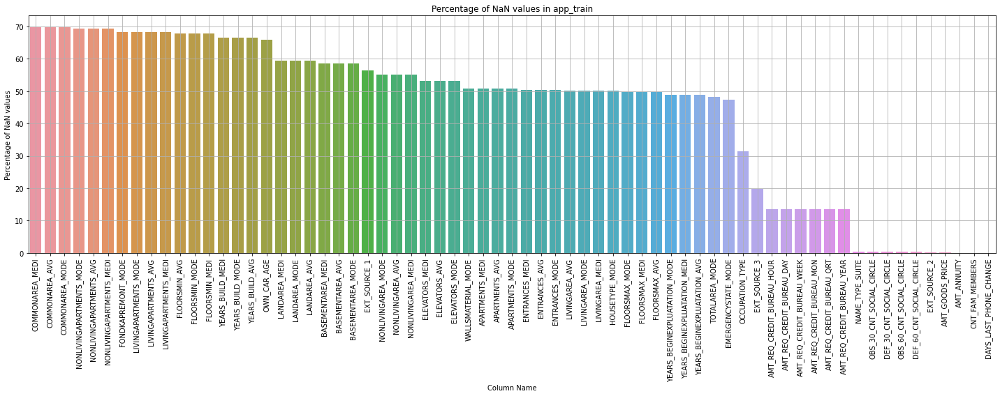

In [272]:
plot_nan_percent(nan_df_create(application_train), 'app_train', grid = True)

In [25]:
application_train.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,...,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,104582.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307509.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,134133.000000,3.068510e+05,246546.000000,151450.00000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,...,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,159080.000000,306490.000000,306490.000000,306490.000000,306490.000000,307510.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.00000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,-4986.120328,-2994.202373,12.061091,0.999997,0.819889,0.199368,0.998133,0.281066,0.056720,2.152665,2.052463,2.031521,12.063419,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,0.502130,5.143927e-01,0.510853,0.11744,0.088442,0.977735,0.752471,0.044621,0.078942,0.149725,0.226282,0.231894,0.066333,0.100775,0.107399,0.008809,0.028358,0.114231,0.087543,0.977065,0.759637,...,0.105645,0.105975,0.008076,0.027022,0.117850,0.087955,0.977752,0.755746,0.044595,0.078078,0.149213,0.225897,0.231625,0.067169,0.101954,0.108607,0.008651,0.028236,0.102547,1.422245,0.143421,1.405292,0.100049,-962.858788,0.000042,0.710023,0.000081,0.015115,0.088055,0.000192

In [26]:
application_train["TARGET"].value_counts()

0    282686
1     24825
Name: TARGET, dtype: int64

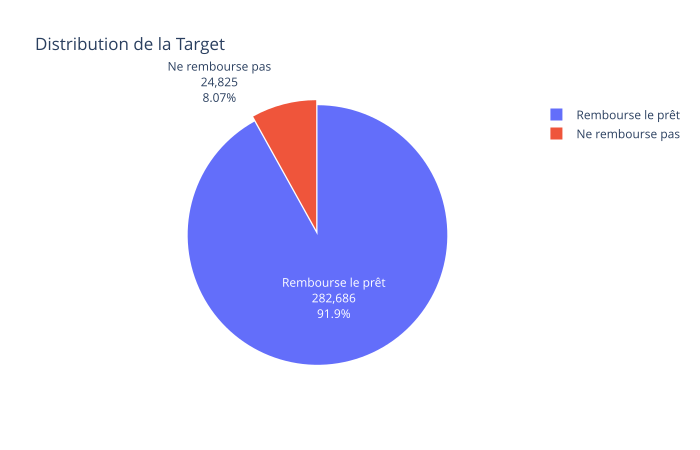

In [27]:
target_distribution = application_train.TARGET.value_counts()
labels = ['Rembourse le prêt ', 'Ne rembourse pas']

fig = go.Figure(data = [
        go.Pie(values = target_distribution, labels = labels, textinfo = 'label+percent+value' , pull = [0,0.04])], 
         layout = go.Layout(title = 'Distribution de la Target'))

fig.show(renderer = 'svg')

In [ ]:
categorical_columns = ['TARGET','FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE',
                                   'FLAG_PHONE', 'FLAG_EMAIL','REGION_RATING_CLIENT','REGION_RATING_CLIENT_W_CITY',
                                  'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
                                   'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 
                                'LIVE_CITY_NOT_WORK_CITY'] + ['FLAG_DOCUMENT_' + str(i) for i in range(2,22)] + application_train.dtypes[
                                    application_train.dtypes == 'object'].index.tolist()
plot_phik_matrix(application_train, categorical_columns, figsize = (15,15), fontsize = 8)


----------------------------------------------------------------------------------------------------


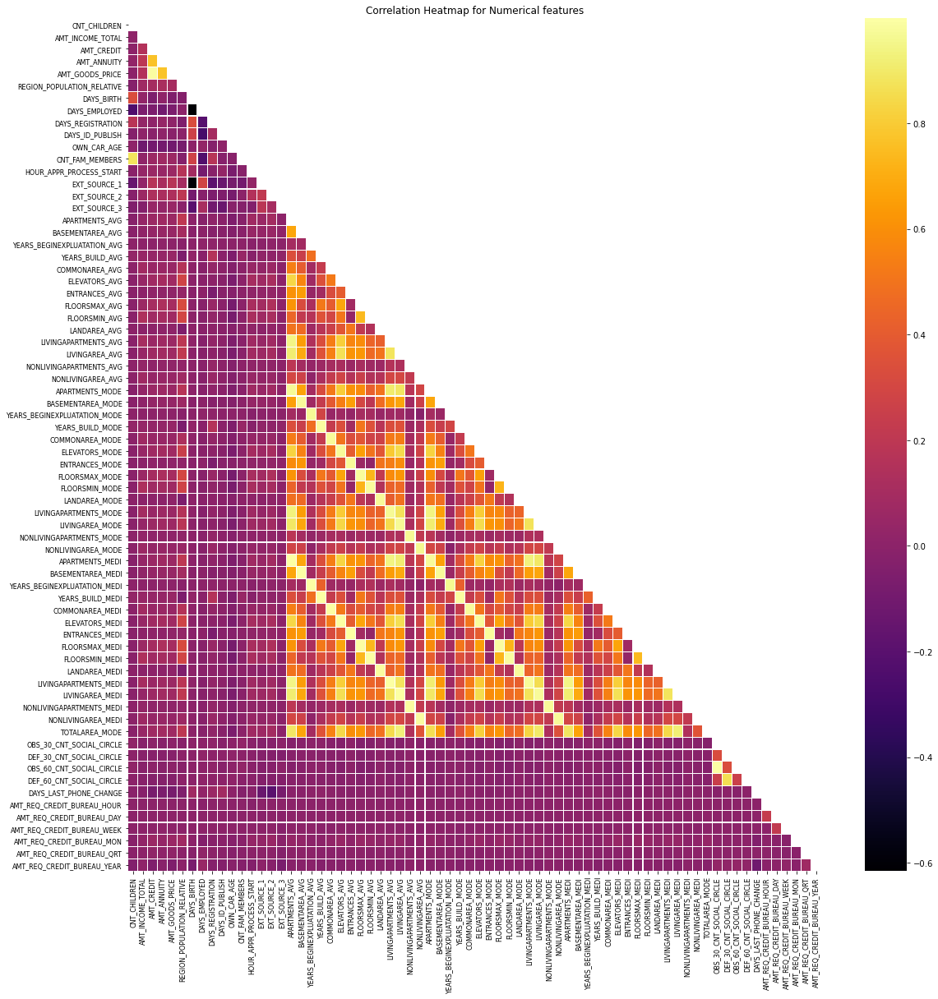

----------------------------------------------------------------------------------------------------


In [20]:
columns_to_drop = ['SK_ID_CURR'] + list(set(categorical_columns) - set(['TARGET']))
corr_mat = correlation_matrix(application_train, columns_to_drop, figsize = (17,17), fontsize = 8, cmap = 'inferno')
corr_mat.plot_correlation_matrix()

In [21]:
top_corr_target_df = corr_mat.target_top_corr()
print("-" * 100)
print("Colonnes avec la corrélation PhiK les plus élevées:")
display(top_corr_target_df)
print("-"*100)

interval columns not set, guessing: ['TARGET', 'CNT_CHILDREN']
interval columns not set, guessing: ['TARGET', 'AMT_INCOME_TOTAL']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT']
interval columns not set, guessing: ['TARGET', 'AMT_ANNUITY']
interval columns not set, guessing: ['TARGET', 'AMT_GOODS_PRICE']
interval columns not set, guessing: ['TARGET', 'REGION_POPULATION_RELATIVE']
interval columns not set, guessing: ['TARGET', 'DAYS_BIRTH']
interval columns not set, guessing: ['TARGET', 'DAYS_EMPLOYED']
interval columns not set, guessing: ['TARGET', 'DAYS_REGISTRATION']
interval columns not set, guessing: ['TARGET', 'DAYS_ID_PUBLISH']
interval columns not set, guessing: ['TARGET', 'OWN_CAR_AGE']
interval columns not set, guessing: ['TARGET', 'CNT_FAM_MEMBERS']
interval columns not set, guessing: ['TARGET', 'HOUR_APPR_PROCESS_START']
interval columns not set, guessing: ['TARGET', 'EXT_SOURCE_1']
interval columns not set, guessing: ['TARGET', 'EXT_SOURCE_2']
interval columns 

,Column Name,Phik-Correlation
15,EXT_SOURCE_3,0.247680
13,EXT_SOURCE_1,0.217846
14,EXT_SOURCE_2,0.213965
6,DAYS_BIRTH,0.102378
63,DAYS_LAST_PHONE_CHANGE,0.073218
7,DAYS_EMPLOYED,0.072095
9,DAYS_ID_PUBLISH,0.067766
4,AMT_GOODS_PRICE,0.059094
23,FLOORSMAX_AVG,0.058826
51,FLOORSMAX_MEDI,0.058595


----------------------------------------------------------------------------------------------------


Nous allons maintenant analyser les différentes variables qui nous allons probablement garder. Voyons plus en détail. 

In [273]:
#let us first see the unique categories of 'NAME_CONTRACT_TYPE'
print_unique_categories(application_train, 'NAME_CONTRACT_TYPE')

#plotting the Pie Plot for the column
plot_categorical_variables_pie(application_train, 'NAME_CONTRACT_TYPE', hole = 0.5)
print('-'*100)

----------------------------------------------------------------------------------------------------
Les catégories uniques de  'NAME_CONTRACT_TYPE' sont:
['Cash loans' 'Revolving loans']
----------------------------------------------------------------------------------------------------


----------------------------------------------------------------------------------------------------


In [274]:
print_unique_categories(application_train, 'CODE_GENDER', show_counts = True)

plot_categorical_variables_pie(application_train, 'CODE_GENDER', hole = 0.5)
print('-'*100)


----------------------------------------------------------------------------------------------------
Les catégories uniques de  'CODE_GENDER' sont:
['M' 'F' 'XNA']
----------------------------------------------------------------------------------------------------
Nombre de Valeurs :
F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64
----------------------------------------------------------------------------------------------------


----------------------------------------------------------------------------------------------------


In [276]:
print_unique_categories(application_train, 'FLAG_EMP_PHONE')

plot_categorical_variables_pie(application_train, column_name = 'FLAG_EMP_PHONE', hole = 0.5)
print('-'*100)


----------------------------------------------------------------------------------------------------
Les catégories uniques de  'FLAG_EMP_PHONE' sont:
[1 0]
----------------------------------------------------------------------------------------------------


----------------------------------------------------------------------------------------------------


In [275]:
print_unique_categories(application_train, 'REGION_RATING_CLIENT_W_CITY')

plot_categorical_variables_pie(application_train, column_name = 'REGION_RATING_CLIENT_W_CITY')
print('-'*100)


----------------------------------------------------------------------------------------------------
Les catégories uniques de  'REGION_RATING_CLIENT_W_CITY' sont:
[2 1 3]
----------------------------------------------------------------------------------------------------


----------------------------------------------------------------------------------------------------


----------------------------------------------------------------------------------------------------
Les catégories uniques de  'NAME_EDUCATION_TYPE' sont:
['Secondary / secondary special' 'Higher education' 'Incomplete higher'
 'Lower secondary' 'Academic degree']
----------------------------------------------------------------------------------------------------
Nombre de Valeurs :
Secondary / secondary special    218391
Higher education                  74863
Incomplete higher                 10277
Lower secondary                    3816
Academic degree                     164
Name: NAME_EDUCATION_TYPE, dtype: int64
----------------------------------------------------------------------------------------------------
Nombre de catégories uniques NAME_EDUCATION_TYPE = 5


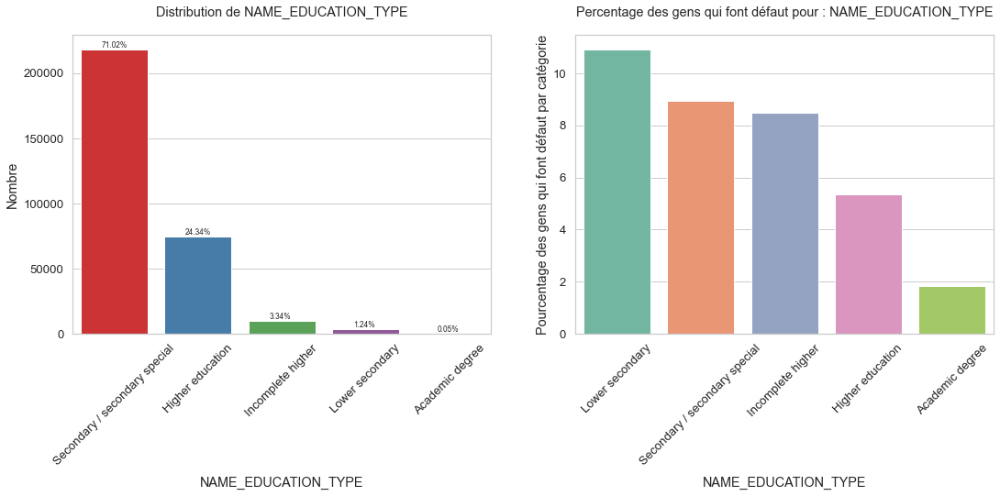

----------------------------------------------------------------------------------------------------


In [26]:
print_unique_categories(application_train, 'NAME_EDUCATION_TYPE', show_counts = True)

plot_categorical_variables_bar(application_train, column_name = 'NAME_EDUCATION_TYPE', rotation = 45, horizontal_adjust = 0.25)
print('-'*100)


----------------------------------------------------------------------------------------------------
Les catégories uniques de  'FLAG_DOCUMENT_3' sont:
[1 0]
----------------------------------------------------------------------------------------------------
Nombre de catégories uniques FLAG_DOCUMENT_3 = 2


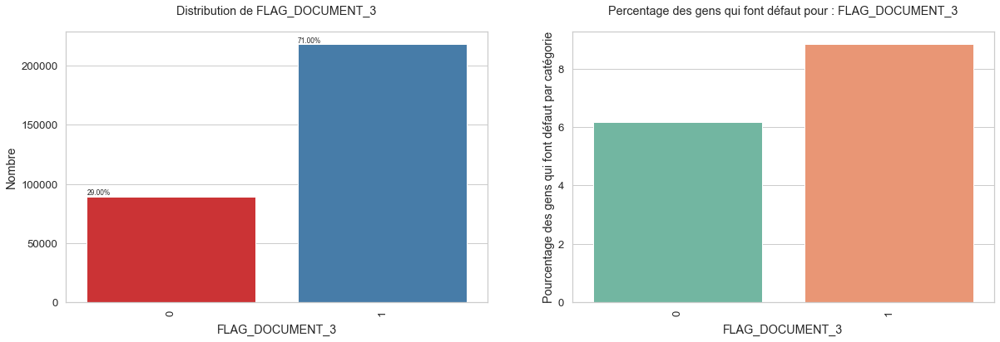

----------------------------------------------------------------------------------------------------


In [27]:
print_unique_categories(application_train, 'FLAG_DOCUMENT_3')

plot_categorical_variables_bar(application_train, column_name = 'FLAG_DOCUMENT_3', figsize = (20,6), rotation = 90)
print('-'*100)


----------------------------------------------------------------------------------------------------
Les catégories uniques de  'OCCUPATION_TYPE' sont:
['Laborers' 'Core staff' 'Accountants' 'Managers' nan 'Drivers'
 'Sales staff' 'Cleaning staff' 'Cooking staff' 'Private service staff'
 'Medicine staff' 'Security staff' 'High skill tech staff'
 'Waiters/barmen staff' 'Low-skill Laborers' 'Realty agents' 'Secretaries'
 'IT staff' 'HR staff']
----------------------------------------------------------------------------------------------------
Nombre de catégories uniques OCCUPATION_TYPE = 19


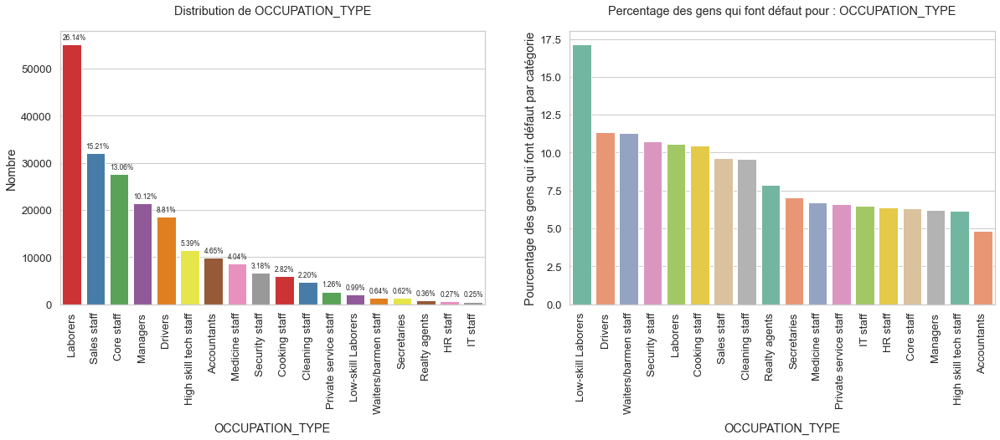

----------------------------------------------------------------------------------------------------


In [28]:
print_unique_categories(application_train, 'OCCUPATION_TYPE')

plot_categorical_variables_bar(application_train, column_name = 'OCCUPATION_TYPE', figsize = (20,6), rotation = 90)
print('-'*100)


Total Number of categories of ORGANIZATION_TYPE = 58


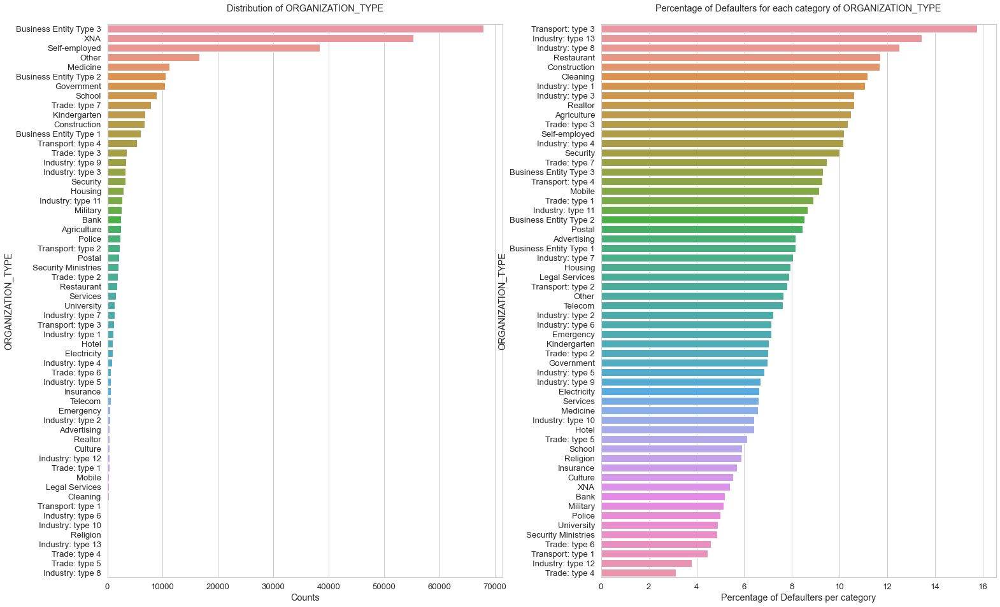

In [29]:
print(f"Total Number of categories of ORGANIZATION_TYPE = {len(application_train.ORGANIZATION_TYPE.unique())}")

plt.figure(figsize = (25,16))
sns.set(style = 'whitegrid', font_scale = 1.2)
plt.subplots_adjust(wspace=0.25)

plt.subplot(1,2,1)
count_organization = application_train.ORGANIZATION_TYPE.value_counts().sort_values(ascending = False)
sns.barplot(x = count_organization, y = count_organization.index)
plt.title('Distribution of ORGANIZATION_TYPE', pad = 20)
plt.xlabel('Counts')
plt.ylabel('ORGANIZATION_TYPE')

plt.subplot(1,2,2)
percentage_default_per_organization = application_train[application_train.TARGET == 1].ORGANIZATION_TYPE.value_counts() * 100 / count_organization
percentage_default_per_organization = percentage_default_per_organization.dropna().sort_values(ascending = False)
sns.barplot(x = percentage_default_per_organization, y = percentage_default_per_organization.index)
plt.title('Percentage of Defaulters for each category of ORGANIZATION_TYPE', pad = 20)
plt.xlabel('Percentage of Defaulters per category')
plt.ylabel('ORGANIZATION_TYPE')

plt.show()

----------------------------------------------------------------------------------------------------
Nombre de catégories uniques REG_CITY_NOT_LIVE_CITY = 2


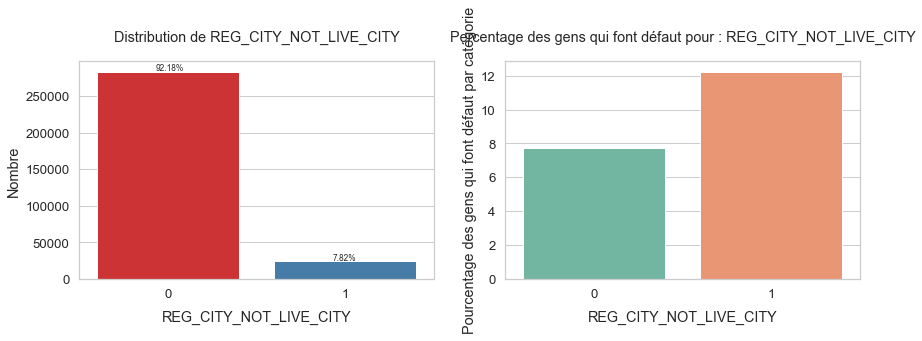

----------------------------------------------------------------------------------------------------
Nombre de catégories uniques REG_CITY_NOT_WORK_CITY = 2


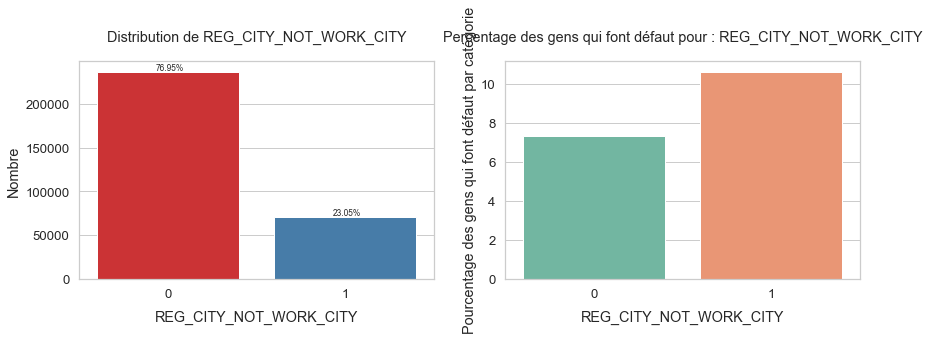

----------------------------------------------------------------------------------------------------
Nombre de catégories uniques LIVE_CITY_NOT_WORK_CITY = 2


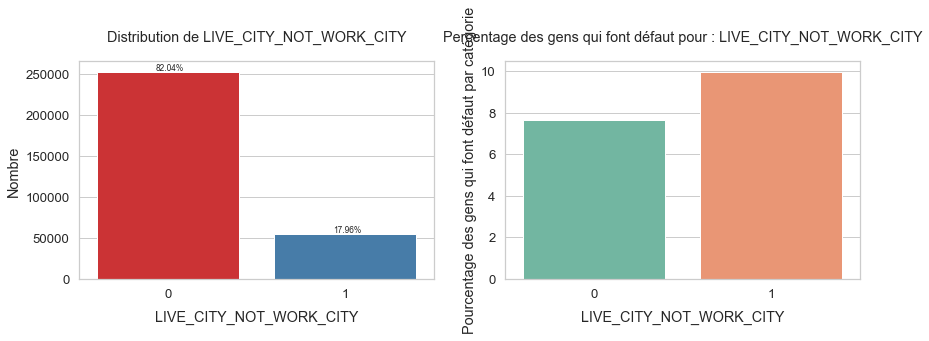

----------------------------------------------------------------------------------------------------


In [30]:
print('-'*100)
plot_categorical_variables_bar(application_train, column_name = 'REG_CITY_NOT_LIVE_CITY', figsize = (14, 4), horizontal_adjust = 0.33)
print('-'*100)
plot_categorical_variables_bar(application_train, column_name = 'REG_CITY_NOT_WORK_CITY', figsize = (14, 4), horizontal_adjust = 0.33)
print('-'*100)
plot_categorical_variables_bar(application_train, column_name = 'LIVE_CITY_NOT_WORK_CITY', figsize = (14, 4), horizontal_adjust = 0.33)
print('-'*100)


----------------------------------------------------------------------------------------------------
Les catégories uniques de  'NAME_INCOME_TYPE' sont:
['Working' 'State servant' 'Commercial associate' 'Pensioner' 'Unemployed'
 'Student' 'Businessman' 'Maternity leave']
----------------------------------------------------------------------------------------------------
Nombre de catégories uniques NAME_INCOME_TYPE = 8


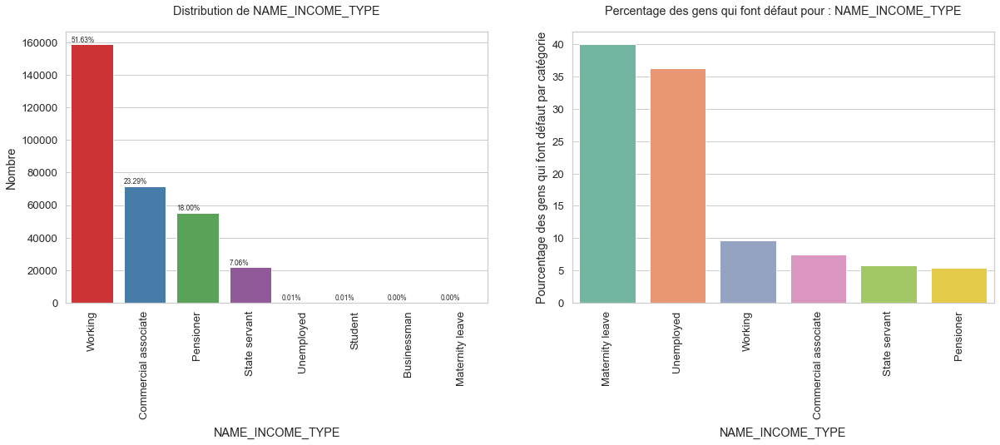

----------------------------------------------------------------------------------------------------


In [31]:
print_unique_categories(application_train, 'NAME_INCOME_TYPE')

plot_categorical_variables_bar(application_train, column_name = 'NAME_INCOME_TYPE', figsize = (20,6), rotation = 90)
print('-'*100)


Total Number of categories of NAME_INCOME_TYPE = 8


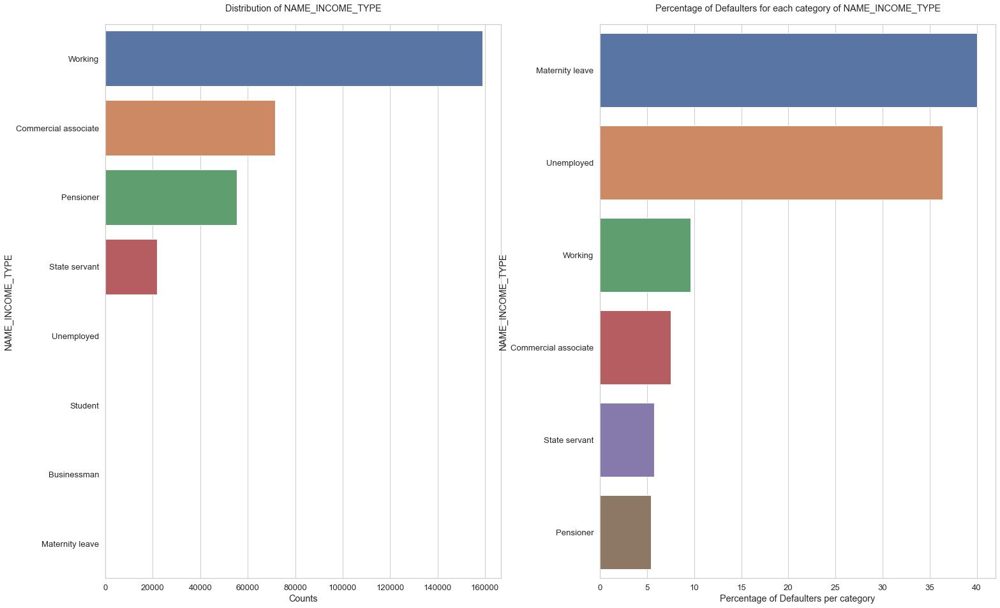

In [32]:
print(f"Total Number of categories of NAME_INCOME_TYPE = {len(application_train.NAME_INCOME_TYPE.unique())}")

plt.figure(figsize = (25,16))
sns.set(style = 'whitegrid', font_scale = 1.2)
plt.subplots_adjust(wspace=0.25)

plt.subplot(1,2,1)
count_organization = application_train.NAME_INCOME_TYPE.value_counts().sort_values(ascending = False)
sns.barplot(x = count_organization, y = count_organization.index)
plt.title('Distribution of NAME_INCOME_TYPE', pad = 20)
plt.xlabel('Counts')
plt.ylabel('NAME_INCOME_TYPE')

plt.subplot(1,2,2)
percentage_default_per_organization = application_train[application_train.TARGET == 1].NAME_INCOME_TYPE.value_counts() * 100 / count_organization
percentage_default_per_organization = percentage_default_per_organization.dropna().sort_values(ascending = False)
sns.barplot(x = percentage_default_per_organization, y = percentage_default_per_organization.index)
plt.title('Percentage of Defaulters for each category of NAME_INCOME_TYPE', pad = 20)
plt.xlabel('Percentage of Defaulters per category')
plt.ylabel('NAME_INCOME_TYPE')

plt.show()

In [33]:
application_train['AGE_YEARS'] = application_train['DAYS_BIRTH'] * -1 / 365

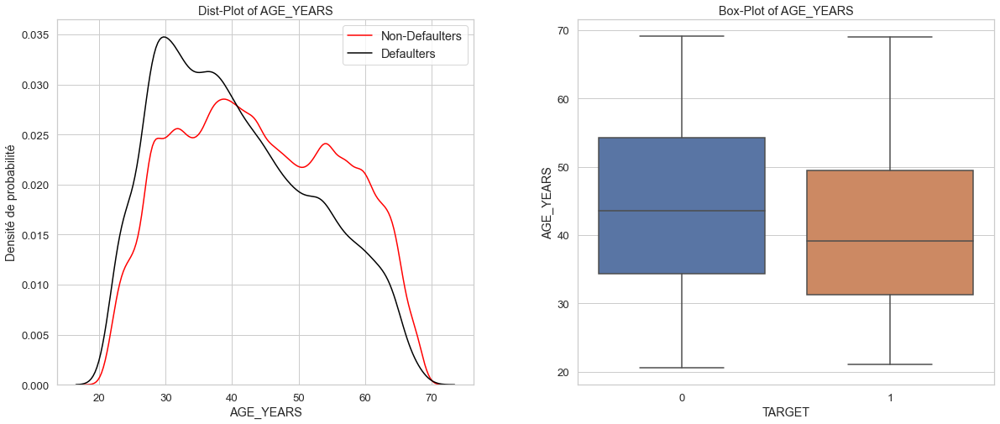

In [34]:
plot_continuous_variables(application_train, 'AGE_YEARS', plots = ['distplot','box'])
_ = application_train.pop('AGE_YEARS')


In [35]:
application_train['YEARS_EMPLOYED'] = application_train.DAYS_EMPLOYED * -1 / 365

----------------------------------------------------------------------------------------------------
The 0th percentile value of DAYS_EMPLOYED is -17912.0
The 25th percentile value of DAYS_EMPLOYED is -2760.0
The 50th percentile value of DAYS_EMPLOYED is -1213.0
The 75th percentile value of DAYS_EMPLOYED is -289.0
The 90th percentile value of DAYS_EMPLOYED is 365243.0
The 92th percentile value of DAYS_EMPLOYED is 365243.0
The 94th percentile value of DAYS_EMPLOYED is 365243.0
The 96th percentile value of DAYS_EMPLOYED is 365243.0
The 98th percentile value of DAYS_EMPLOYED is 365243.0
The 100th percentile value of DAYS_EMPLOYED is 365243.0
----------------------------------------------------------------------------------------------------


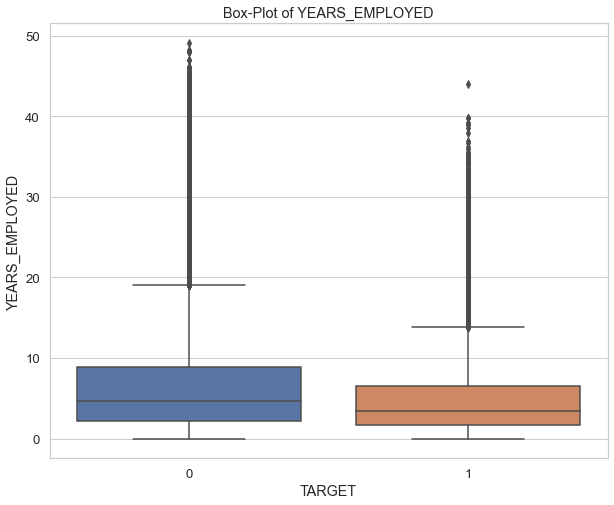

In [36]:
print_percentiles(application_train, 'DAYS_EMPLOYED')
plot_continuous_variables(application_train, 'YEARS_EMPLOYED', plots = ['box'], scale_limits = [0,70], figsize = (10,8))
_ = application_train.pop('YEARS_EMPLOYED')


Text(0.5, 0, 'Days Employment')

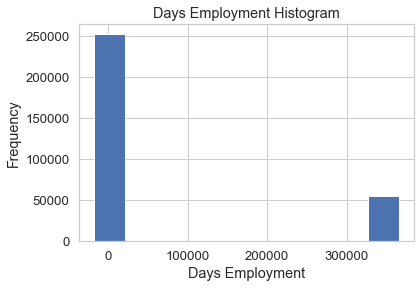

In [37]:
application_train['DAYS_EMPLOYED'].plot.hist(title = 'Days Employment Histogram');
plt.xlabel('Days Employment')

Text(0.5, 0, 'Days Employment')

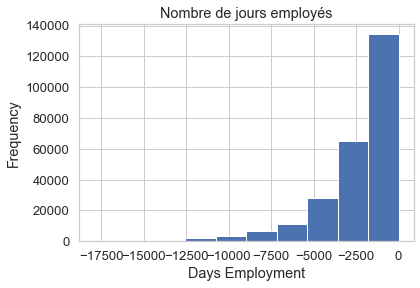

In [38]:
application_train['DAYS_EMPLOYED_ANOM'] = application_train["DAYS_EMPLOYED"] == 365243

# Replace the anomalous values with nan
application_train['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace = True)

application_train['DAYS_EMPLOYED'].plot.hist(title = 'Nombre de jours employés');
plt.xlabel('Days Employment')

In [39]:
application_train['YEARS_EMPLOYED'] = application_train.DAYS_EMPLOYED * -1 / 365


In [40]:
application_train["YEARS_LAST_PHONE_CHANGE"]=application_train["DAYS_LAST_PHONE_CHANGE"]*-1/365

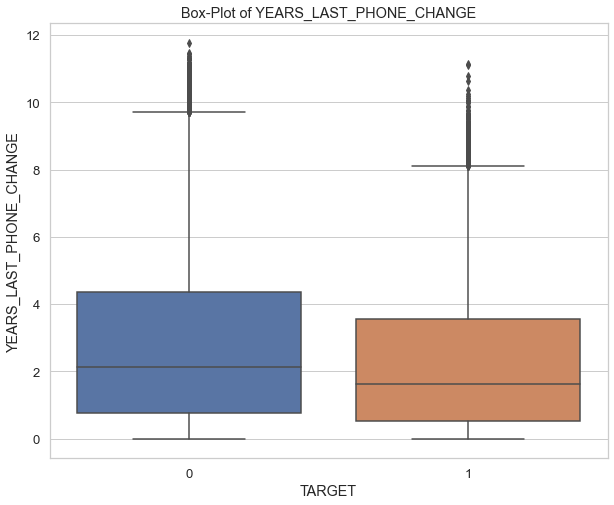

In [41]:
plot_continuous_variables(application_train, 'YEARS_LAST_PHONE_CHANGE', plots = ['box'], figsize = (10,8))


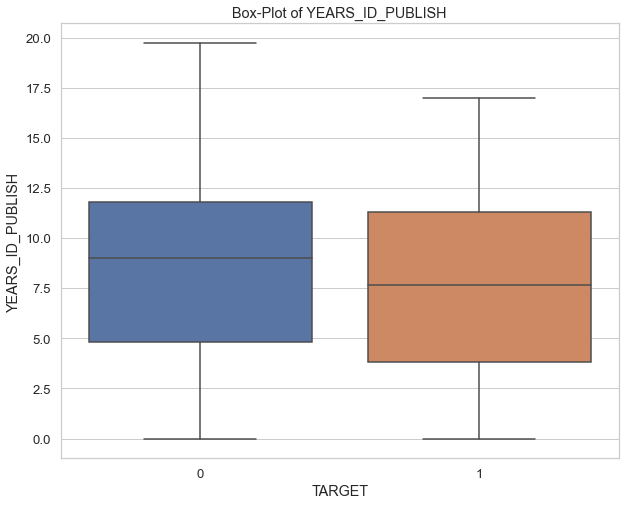

In [42]:
application_train["YEARS_ID_PUBLISH"]=application_train["DAYS_ID_PUBLISH"]*-1/365
plot_continuous_variables(application_train, 'YEARS_ID_PUBLISH', plots = ['box'], figsize = (10,8))


----------------------------------------------------------------------------------------------------


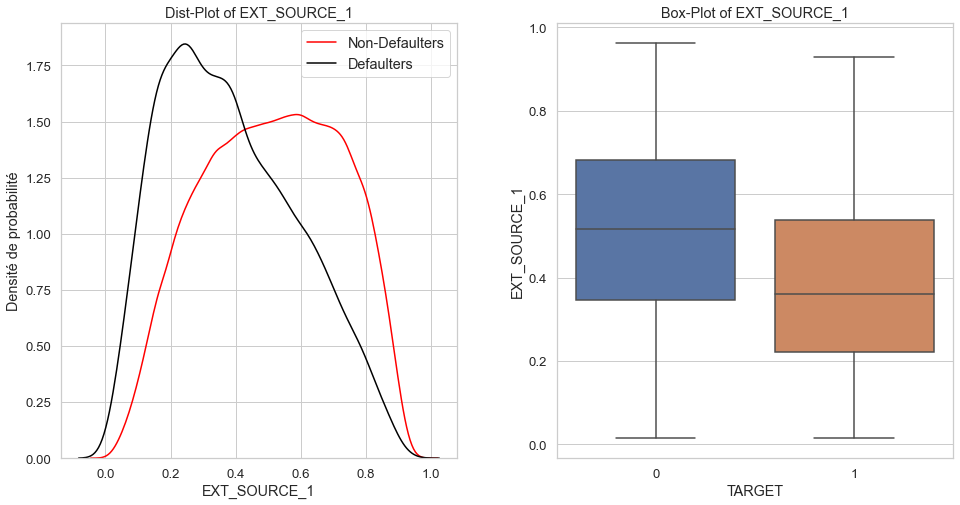

----------------------------------------------------------------------------------------------------


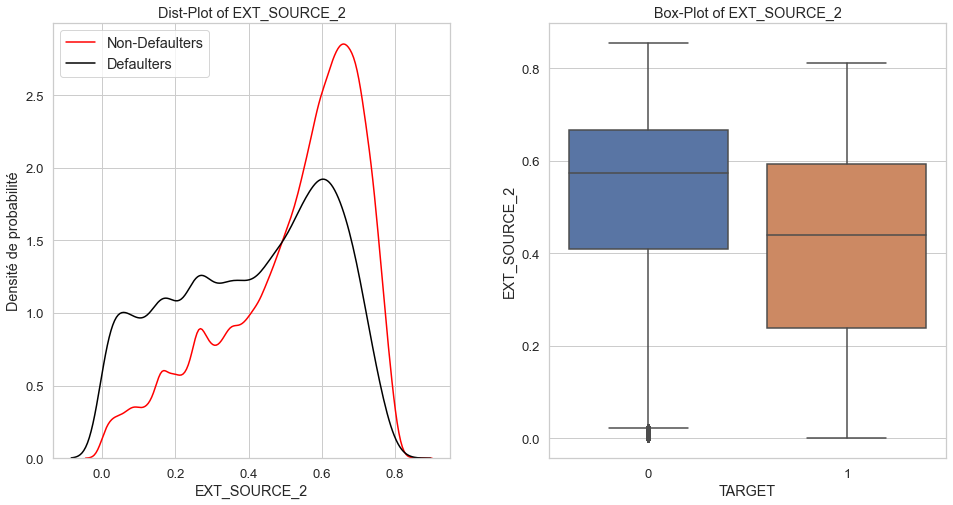

----------------------------------------------------------------------------------------------------


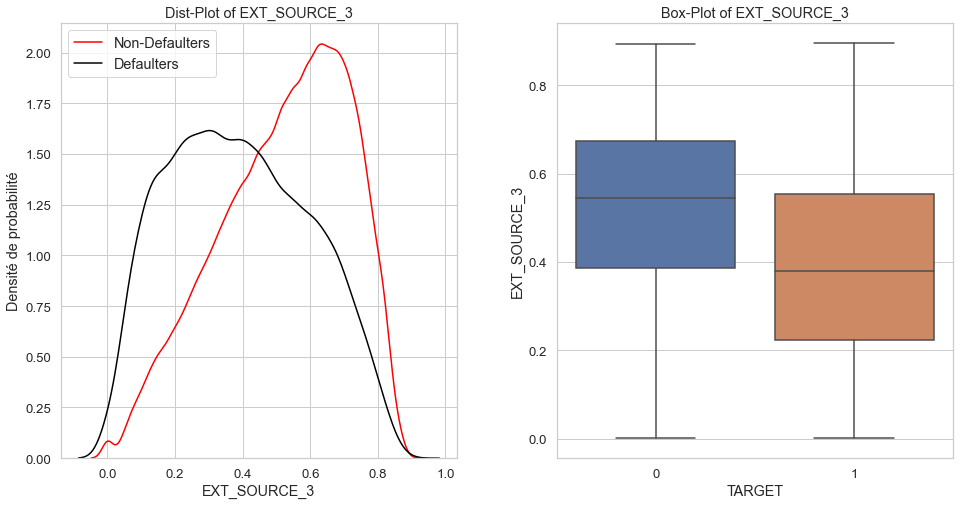

----------------------------------------------------------------------------------------------------


In [43]:
print('-'*100)
plot_continuous_variables(application_train, 'EXT_SOURCE_1', plots = ['distplot', 'box'], figsize = (16,8))
print('-'*100)
plot_continuous_variables(application_train, 'EXT_SOURCE_2', plots = ['distplot', 'box'], figsize = (16,8))
print('-'*100)
plot_continuous_variables(application_train, 'EXT_SOURCE_3', plots = ['distplot', 'box'], figsize = (16,8))
print('-'*100)


## Bureau

In [44]:
bureau=pd.read_csv('bureau.csv')

In [45]:
bureau.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


In [46]:
bureau.describe()

,SK_ID_CURR,SK_ID_BUREAU,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
count,1.716428e+06,1.716428e+06,1.716428e+06,1.716428e+06,1.610875e+06,1.082775e+06,5.919400e+05,1.716428e+06,1.716415e+06,1.458759e+06,1.124648e+06,1.716428e+06,1.716428e+06,4.896370e+05
mean,2.782149e+05,5.924434e+06,-1.142108e+03,8.181666e-01,5.105174e+02,-1.017437e+03,3.825418e+03,6.410406e-03,3.549946e+05,1.370851e+05,6.229515e+03,3.791276e+01,-5.937483e+02,1.571276e+04
std,1.029386e+05,5.322657e+05,7.951649e+02,3.654443e+01,4.994220e+03,7.140106e+02,2.060316e+05,9.622391e-02,1.149811e+06,6.774011e+05,4.503203e+04,5.937650e+03,7.207473e+02,3.258269e+05
min,1.000010e+05,5.000000e+06,-2.922000e+03,0.000000e+00,-4.206000e+04,-4.202300e+04,0.000000e+00,0.000000e+00,0.000000e+00,-4.705600e+06,-5.864061e+05,0.000000e+00,-4.194700e+04,0.000000e+00
25%,1.888668e+05,5.463954e+06,-1.666000e+03,0.000000e+00,-1.138000e+03,-1.489000e+03,0.000000e+00,0.000000e+00,5.130000e+04,0.000000e+00,0.000000e+00,0.000000e+00,-9.080000e+02,0.000000e+00
50%,2.780550e+05,5.926304e+06,-9.870000e+02,0.000000e+00,-3.300000e+02,-8.970000e+02,0.000000e+00,0.000000e+00,1.255185e+05,0.000000e+00,0.000000e+00,0.000000e+00,-3.950000e+02,0.000000e+00
75%,3.674260e+05,6.385681e+06,-4.740000e+02,0.000000e+00,4.740000e+02,-4.250000e+02,0.000000e+00,0.000000e+00,3.150000e+05,4.015350e+04,0.000000e+00,0.000000e+00,-3.300000e+01,1.350000e+04
max,4.562550e+05,6.843457e+06,0.000000e+00,2.792000e+03,3.119900e+04,0.000000e+00,1.159872e+08,9.000000e+00,5.850000e+08,1.701000e+08,4.705600e+06,3.756681e+06,3.720000e+02,1.184534e+08


In [47]:
bureau.shape

(1716428, 17)

In [48]:
bureau_merged = application_train.iloc[:,:2].merge(bureau, on = 'SK_ID_CURR', how = 'left')

Number of columns having NaN values: 7 columns


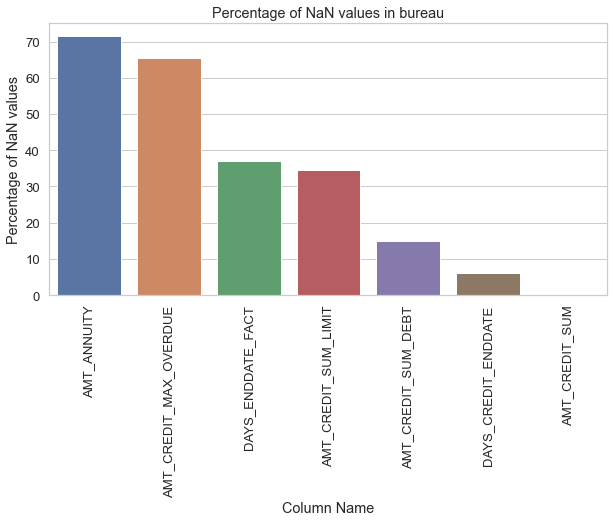

In [49]:
nan_df_bureau = nan_df_create(bureau)
plot_nan_percent(nan_df_bureau, 'bureau', tight_layout = False, figsize = (10,5))

----------------------------------------------------------------------------------------------------


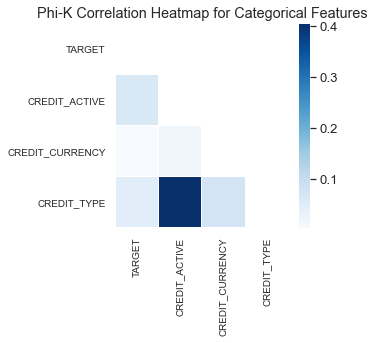

----------------------------------------------------------------------------------------------------
Categories with highest values of Phi-K Correlation value with Target Variable are:


,Column Name,Phik-Correlation
0,CREDIT_ACTIVE,0.064481
2,CREDIT_TYPE,0.049954
1,CREDIT_CURRENCY,0.004993


----------------------------------------------------------------------------------------------------


In [50]:
cols_for_phik = ['TARGET','CREDIT_ACTIVE','CREDIT_CURRENCY','CREDIT_TYPE']
plot_phik_matrix(bureau_merged, cols_for_phik,  figsize = (5,5))


----------------------------------------------------------------------------------------------------


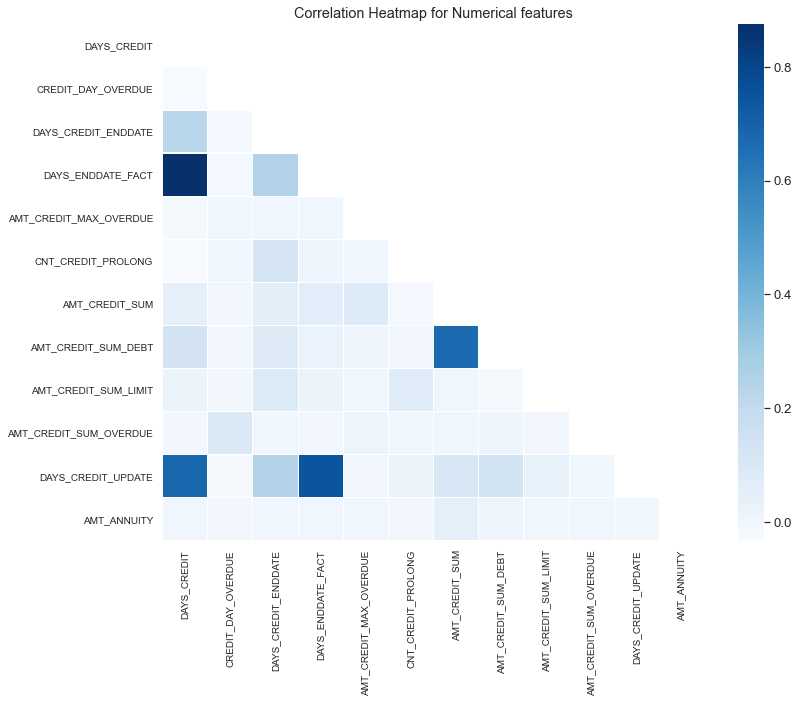

----------------------------------------------------------------------------------------------------


In [51]:
corr_mat = correlation_matrix(bureau_merged, ['SK_ID_CURR','SK_ID_BUREAU'], cmap = 'Blues', figsize = (12,10))
corr_mat.plot_correlation_matrix()

In [52]:
top_corr_target_df = corr_mat.target_top_corr()
print("-" * 100)
print("Colonnes avec la corrélation PhiK les plus élevées:")
display(top_corr_target_df)
print("-"*100)


interval columns not set, guessing: ['TARGET', 'DAYS_CREDIT']
interval columns not set, guessing: ['TARGET', 'CREDIT_DAY_OVERDUE']
interval columns not set, guessing: ['TARGET', 'DAYS_CREDIT_ENDDATE']
interval columns not set, guessing: ['TARGET', 'DAYS_ENDDATE_FACT']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT_MAX_OVERDUE']
interval columns not set, guessing: ['TARGET', 'CNT_CREDIT_PROLONG']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT_SUM']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT_SUM_DEBT']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT_SUM_LIMIT']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT_SUM_OVERDUE']
interval columns not set, guessing: ['TARGET', 'DAYS_CREDIT_UPDATE']
interval columns not set, guessing: ['TARGET', 'AMT_ANNUITY']
----------------------------------------------------------------------------------------------------
Colonnes avec la corrélation PhiK les plus élevées:


,Column Name,Phik-Correlation
0,DAYS_CREDIT,0.088651
2,DAYS_CREDIT_ENDDATE,0.018980
9,AMT_CREDIT_SUM_OVERDUE,0.005654
8,AMT_CREDIT_SUM_LIMIT,0.005192
4,AMT_CREDIT_MAX_OVERDUE,0.004280
5,CNT_CREDIT_PROLONG,0.003862
1,CREDIT_DAY_OVERDUE,0.002528
10,DAYS_CREDIT_UPDATE,0.002219
7,AMT_CREDIT_SUM_DEBT,0.001695
6,AMT_CREDIT_SUM,0.000670


----------------------------------------------------------------------------------------------------


In [53]:
bureau_merged.corr()['TARGET'].sort_values()

AMT_CREDIT_SUM           -0.010606
SK_ID_BUREAU             -0.009018
AMT_CREDIT_SUM_LIMIT     -0.005990
SK_ID_CURR               -0.002900
AMT_ANNUITY               0.000117
CNT_CREDIT_PROLONG        0.001523
AMT_CREDIT_MAX_OVERDUE    0.001587
AMT_CREDIT_SUM_DEBT       0.002539
CREDIT_DAY_OVERDUE        0.002652
AMT_CREDIT_SUM_OVERDUE    0.006253
DAYS_CREDIT_ENDDATE       0.026497
DAYS_ENDDATE_FACT         0.039057
DAYS_CREDIT_UPDATE        0.041076
DAYS_CREDIT               0.061556
TARGET                    1.000000
Name: TARGET, dtype: float64

DAYS_CREDIT and DAYS_CREDIT_UPDATE // sont corrélés entre eux et a la target également

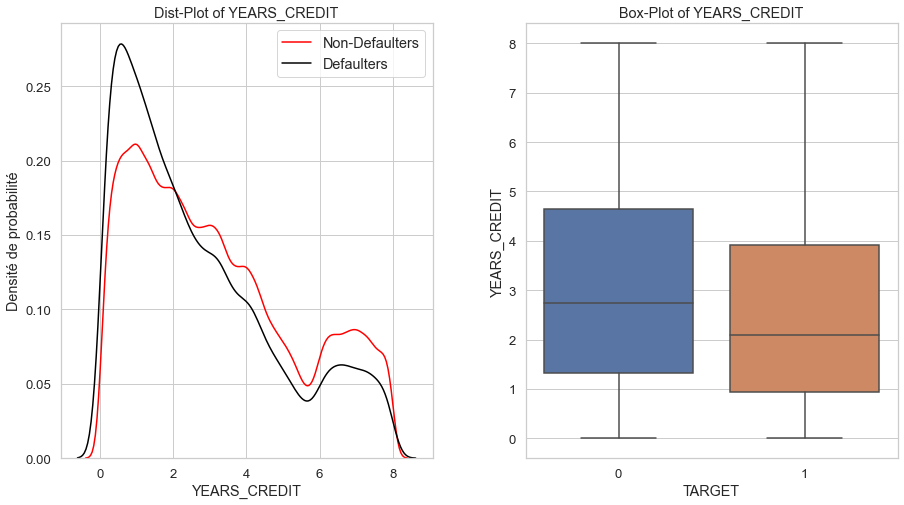

In [54]:
bureau_merged['YEARS_CREDIT'] = bureau_merged['DAYS_CREDIT'] / -365
plot_continuous_variables(bureau_merged, 'YEARS_CREDIT', plots = ['distplot', 'box'], figsize = (15,8))
_ = bureau_merged.pop('YEARS_CREDIT')

## bureau_balance



In [55]:
bureau_balance = pd.read_csv('bureau_balance.csv')

In [56]:
bureau_balance.head()

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


In [57]:
bureau_balance.shape

(27299925, 3)

In [58]:
bureau_balance["STATUS"].value_counts()

C    13646993
0     7499507
X     5810482
1      242347
5       62406
2       23419
3        8924
4        5847
Name: STATUS, dtype: int64

In [59]:
plot_nan_percent(nan_df_create(bureau_balance), 'bureau_balance')

Le dataframe bureau_balance ne contient pas de valeurs manquantes.


In [60]:
bureau_balance_merged = bureau_merged.iloc[:,:3].merge(bureau_balance, on = 'SK_ID_BUREAU', how = 'left')

In [61]:
bureau_balance_merged["STATUS_NUM"] = bureau_balance_merged["STATUS"].astype('category').cat.codes

In [62]:
bureau_balance_merged.corr()['TARGET'].sort_values()

STATUS_NUM       -0.019611
SK_ID_BUREAU     -0.008195
SK_ID_CURR        0.000613
MONTHS_BALANCE    0.027773
TARGET            1.000000
Name: TARGET, dtype: float64

Il n'y a aucune corrélation intéréssante ici, on n'utilisera pas ce dataframe

## previous_application




In [63]:
previous_application = pd.read_csv('previous_application.csv')

In [64]:
previous_application.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


----------------------------------------------------------------------------------------------------
Number of columns having NaN values: 16 columns


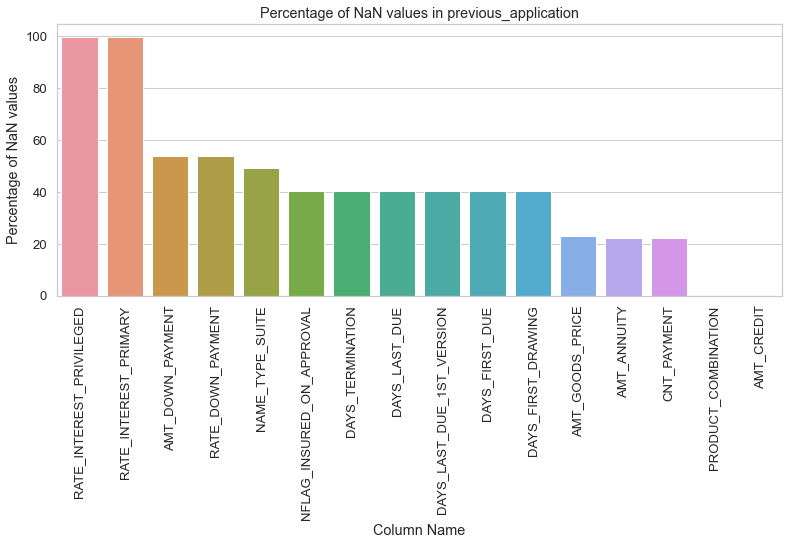

----------------------------------------------------------------------------------------------------


In [65]:
previous_application_nan = nan_df_create(previous_application)
print('-' * 100)
plot_nan_percent(previous_application_nan, 'previous_application', tight_layout = False, figsize = (13,5))
print('-' * 100)
del previous_application_nan

In [66]:
prev_merged = application_train.iloc[:,:2].merge(previous_application, on = 'SK_ID_CURR', how = 'left')

In [67]:
prev_merged.corr()['TARGET'].sort_values()

DAYS_FIRST_DRAWING          -0.031154
HOUR_APPR_PROCESS_START     -0.027809
RATE_DOWN_PAYMENT           -0.026111
AMT_DOWN_PAYMENT            -0.016918
AMT_ANNUITY                 -0.014922
DAYS_FIRST_DUE              -0.006651
AMT_APPLICATION             -0.005583
NFLAG_LAST_APPL_IN_DAY      -0.002887
SELLERPLACE_AREA            -0.002539
AMT_CREDIT                  -0.002350
RATE_INTEREST_PRIMARY       -0.001470
SK_ID_CURR                  -0.001216
AMT_GOODS_PRICE              0.000254
NFLAG_INSURED_ON_APPROVAL    0.000653
SK_ID_PREV                   0.002009
DAYS_TERMINATION             0.016981
DAYS_LAST_DUE                0.017522
DAYS_LAST_DUE_1ST_VERSION    0.018021
RATE_INTEREST_PRIVILEGED     0.028640
CNT_PAYMENT                  0.030480
DAYS_DECISION                0.039901
TARGET                       1.000000
Name: TARGET, dtype: float64

Aucune valeur corrélée a la target, on laisse. 

In [68]:
prev_merged = application_train.iloc[:,:2].merge(previous_application, on = 'SK_ID_CURR', how = 'left')


----------------------------------------------------------------------------------------------------


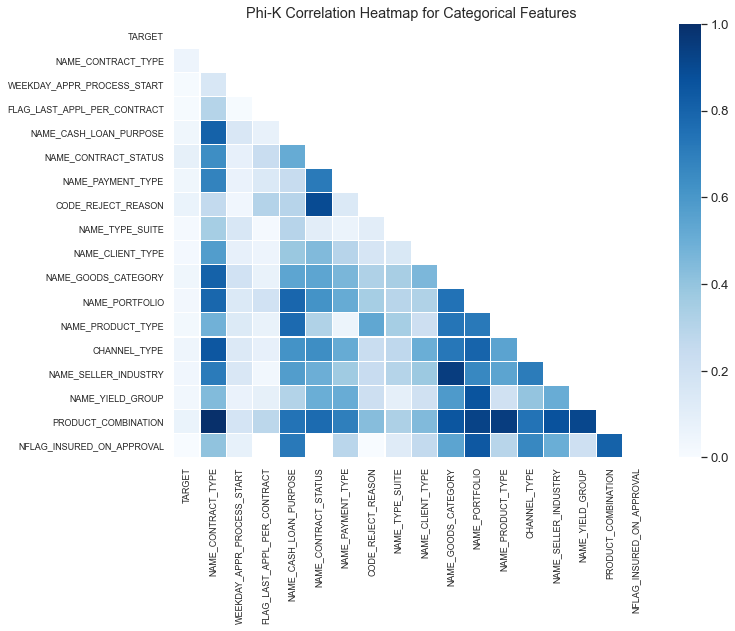

----------------------------------------------------------------------------------------------------
Categories with highest values of Phi-K Correlation value with Target Variable are:


,Column Name,Phik-Correlation
4,NAME_CONTRACT_STATUS,0.088266
15,PRODUCT_COMBINATION,0.063839
6,CODE_REJECT_REASON,0.062771
0,NAME_CONTRACT_TYPE,0.050859
12,CHANNEL_TYPE,0.050302
9,NAME_GOODS_CATEGORY,0.042951
3,NAME_CASH_LOAN_PURPOSE,0.040305
5,NAME_PAYMENT_TYPE,0.039752
13,NAME_SELLER_INDUSTRY,0.038077
14,NAME_YIELD_GROUP,0.034626


----------------------------------------------------------------------------------------------------


In [69]:
cols_for_phik = ['TARGET'] + prev_merged.dtypes[prev_merged.dtypes == 'object'].index.tolist() + ['NFLAG_INSURED_ON_APPROVAL']
plot_phik_matrix(prev_merged, cols_for_phik, cmap = 'Blues', figsize = (11,9), fontsize = 9)


----------------------------------------------------------------------------------------------------


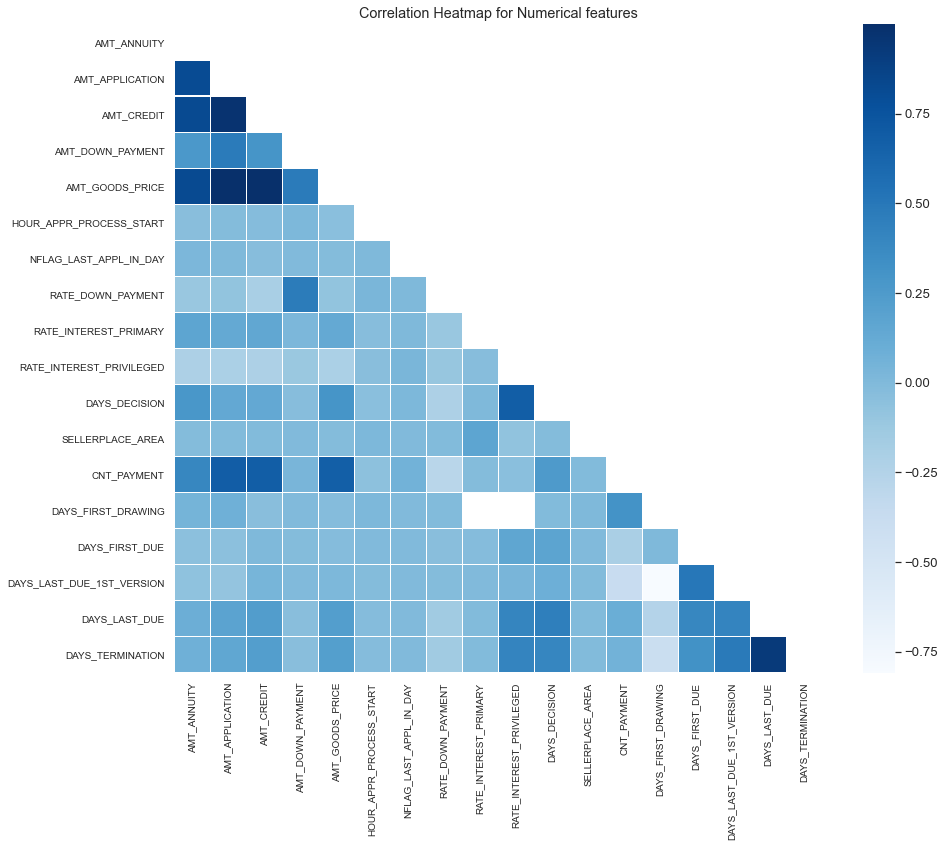

----------------------------------------------------------------------------------------------------


In [70]:
corr_mat = correlation_matrix(prev_merged, ['SK_ID_CURR','SK_ID_PREV','NFLAG_INSURED_ON_APPROVAL'], cmap = 'Blues', figsize = (14,12))
corr_mat.plot_correlation_matrix()

Aucune valeur corrélée a la target, on laisse. 

In [71]:
top_corr_target_df = corr_mat.target_top_corr()
print("-" * 100)
print("Colonnes avec la corrélation avec la target les plus élevées:")
display(top_corr_target_df)
print("-"*100)

interval columns not set, guessing: ['TARGET', 'AMT_ANNUITY']
interval columns not set, guessing: ['TARGET', 'AMT_APPLICATION']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT']
interval columns not set, guessing: ['TARGET', 'AMT_DOWN_PAYMENT']
interval columns not set, guessing: ['TARGET', 'AMT_GOODS_PRICE']
interval columns not set, guessing: ['TARGET', 'HOUR_APPR_PROCESS_START']
interval columns not set, guessing: ['TARGET', 'NFLAG_LAST_APPL_IN_DAY']
interval columns not set, guessing: ['TARGET', 'RATE_DOWN_PAYMENT']
interval columns not set, guessing: ['TARGET', 'RATE_INTEREST_PRIMARY']
interval columns not set, guessing: ['TARGET', 'RATE_INTEREST_PRIVILEGED']
interval columns not set, guessing: ['TARGET', 'DAYS_DECISION']
interval columns not set, guessing: ['TARGET', 'SELLERPLACE_AREA']
interval columns not set, guessing: ['TARGET', 'CNT_PAYMENT']
interval columns not set, guessing: ['TARGET', 'DAYS_FIRST_DRAWING']
interval columns not set, guessing: ['TARGET', 'DAYS_F

,Column Name,Phik-Correlation
12,CNT_PAYMENT,0.056639
10,DAYS_DECISION,0.053694
13,DAYS_FIRST_DRAWING,0.048993
7,RATE_DOWN_PAYMENT,0.039592
5,HOUR_APPR_PROCESS_START,0.038121
9,RATE_INTEREST_PRIVILEGED,0.028204
15,DAYS_LAST_DUE_1ST_VERSION,0.027878
16,DAYS_LAST_DUE,0.027320
17,DAYS_TERMINATION,0.026479
0,AMT_ANNUITY,0.013808


----------------------------------------------------------------------------------------------------


Il n'y a aucune corrélation intéréssante ici, on n'utilisera pas ce dataframe

# POS_CASH_balance.csv¶


In [72]:
POS_CASH_balance = pd.read_csv('POS_CASH_balance.csv')

In [73]:
POS_CASH_balance.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


Number of columns having NaN values: 2 columns


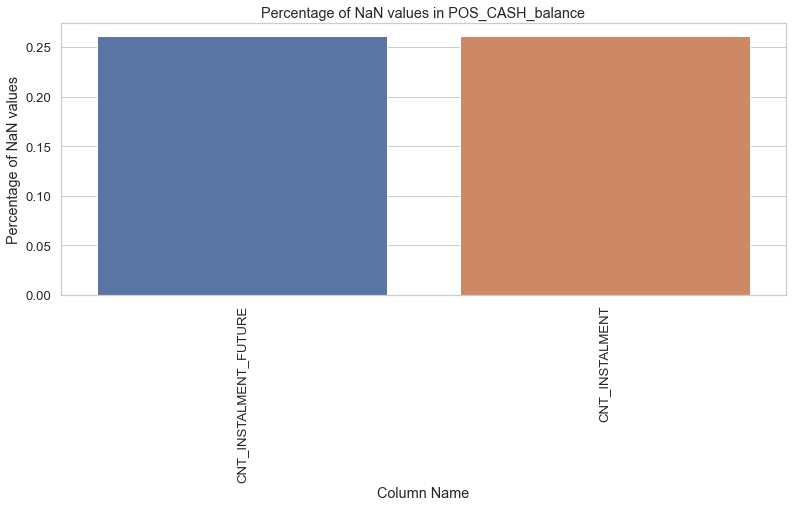

In [74]:
POS_CASH_balance_nan = nan_df_create(POS_CASH_balance)
plot_nan_percent(POS_CASH_balance_nan, 'POS_CASH_balance', tight_layout = False, figsize = (13,5))
del POS_CASH_balance_nan

In [75]:
POS_CASH_balance_merged = prev_merged.iloc[:,:3].merge(POS_CASH_balance, on = 'SK_ID_PREV', how = 'left')

----------------------------------------------------------------------------------------------------


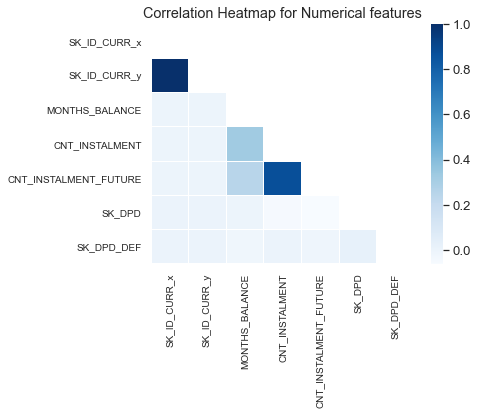

----------------------------------------------------------------------------------------------------


In [76]:
corr_mat = correlation_matrix(POS_CASH_balance_merged, ['SK_ID_PREV'], figsize = (7,6))
corr_mat.plot_correlation_matrix()

In [77]:
top_corr_target_df = corr_mat.target_top_corr()
print("-" * 100)
print("Colonnes avec la corrélation PhiK les plus élevées:")
display(top_corr_target_df)
print("-"*100)

interval columns not set, guessing: ['TARGET', 'SK_ID_CURR_x']
interval columns not set, guessing: ['TARGET', 'SK_ID_CURR_y']
interval columns not set, guessing: ['TARGET', 'MONTHS_BALANCE']
interval columns not set, guessing: ['TARGET', 'CNT_INSTALMENT']
interval columns not set, guessing: ['TARGET', 'CNT_INSTALMENT_FUTURE']
interval columns not set, guessing: ['TARGET', 'SK_DPD']
interval columns not set, guessing: ['TARGET', 'SK_DPD_DEF']
----------------------------------------------------------------------------------------------------
Colonnes avec la corrélation PhiK les plus élevées:


,Column Name,Phik-Correlation
4,CNT_INSTALMENT_FUTURE,0.033503
3,CNT_INSTALMENT,0.031347
2,MONTHS_BALANCE,0.026192
5,SK_DPD,0.009490
1,SK_ID_CURR_y,0.006411
0,SK_ID_CURR_x,0.006059
6,SK_DPD_DEF,0.004385


----------------------------------------------------------------------------------------------------


Il n'y a aucune corrélation intéréssante ici, on n'utilisera pas ce dataframe

# INSTALLMENTS_PAYMENTS.CSV

In [78]:
installments_payments = pd.read_csv('installments_payments.csv')

In [79]:
installments_payments.head()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


In [80]:
installments_payments.shape

(13605401, 8)

Number of columns having NaN values: 2 columns


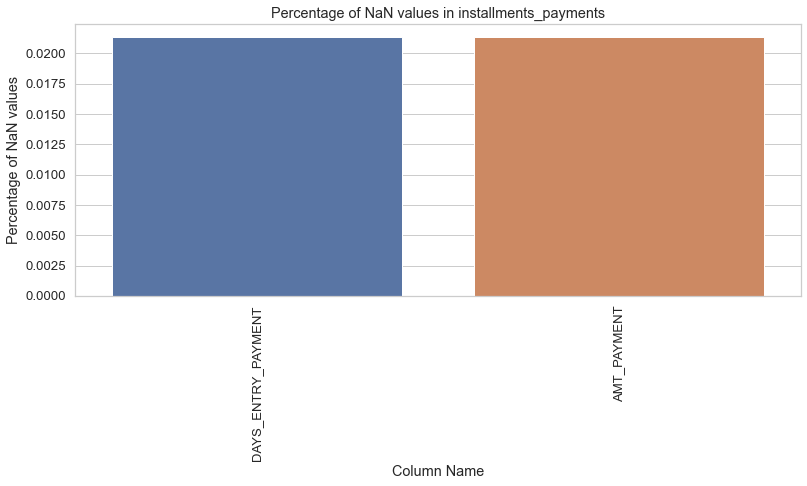

In [81]:
installments_payments_nan = nan_df_create(installments_payments)
plot_nan_percent(installments_payments_nan, 'installments_payments', tight_layout = False, figsize = (13,5))
del installments_payments_nan

In [82]:
installments_payments_merged = prev_merged.iloc[:,:3].merge(installments_payments, on = 'SK_ID_PREV', how = 'left')

In [83]:
installments_payments_merged.head()

,SK_ID_CURR_x,TARGET,SK_ID_PREV,SK_ID_CURR_y,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,100002,1,1038818.0,100002.0,1.0,16.0,-115.0,-133.0,9251.775,9251.775
1,100002,1,1038818.0,100002.0,1.0,8.0,-355.0,-375.0,9251.775,9251.775
2,100002,1,1038818.0,100002.0,2.0,19.0,-25.0,-49.0,53093.745,53093.745
3,100002,1,1038818.0,100002.0,1.0,12.0,-235.0,-250.0,9251.775,9251.775
4,100002,1,1038818.0,100002.0,1.0,9.0,-325.0,-344.0,9251.775,9251.775


In [84]:
installments_payments_merged.corr()['TARGET'].sort_values()

NUM_INSTALMENT_VERSION   -0.016099
NUM_INSTALMENT_NUMBER    -0.005664
AMT_PAYMENT              -0.005479
AMT_INSTALMENT           -0.003378
SK_ID_CURR_y             -0.002934
SK_ID_CURR_x             -0.002825
SK_ID_PREV               -0.000120
DAYS_INSTALMENT           0.032588
DAYS_ENTRY_PAYMENT        0.032783
TARGET                    1.000000
Name: TARGET, dtype: float64

Il n'y a aucune corrélation intéréssante ici, on n'utilisera pas ce dataframe

## credit_card_balance

In [85]:
credit_card_balance = pd.read_csv('credit_card_balance.csv')

In [86]:
credit_card_balance.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,1800.0,1800.0,0.000,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,2250.0,2250.0,60175.080,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,2250.0,2250.0,26926.425,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,11925.0,11925.0,224949.285,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,27000.0,27000.0,443044.395,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


In [87]:
credit_card_balance.shape

(3840312, 23)

----------------------------------------------------------------------------------------------------
Number of columns having NaN values: 9 columns


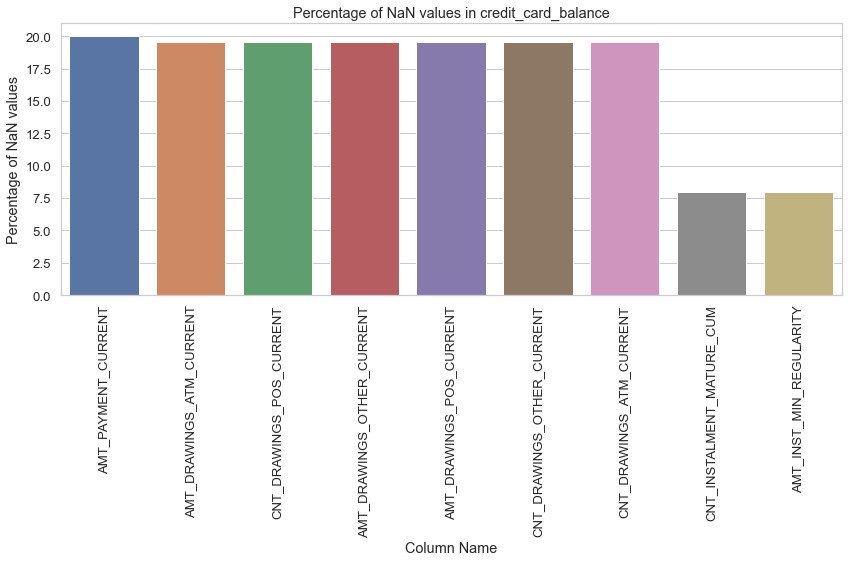

----------------------------------------------------------------------------------------------------


In [88]:
credit_card_balance_nan = nan_df_create(credit_card_balance)
print('-'*100)
plot_nan_percent(credit_card_balance_nan, 'credit_card_balance', tight_layout = False, rotation = 90, figsize = (14,5))
print('-'*100)
del credit_card_balance_nan

In [89]:
credit_card_balance_merged = application_train.iloc[:,:2].merge(credit_card_balance, on = 'SK_ID_CURR', how = 'left')

----------------------------------------------------------------------------------------------------


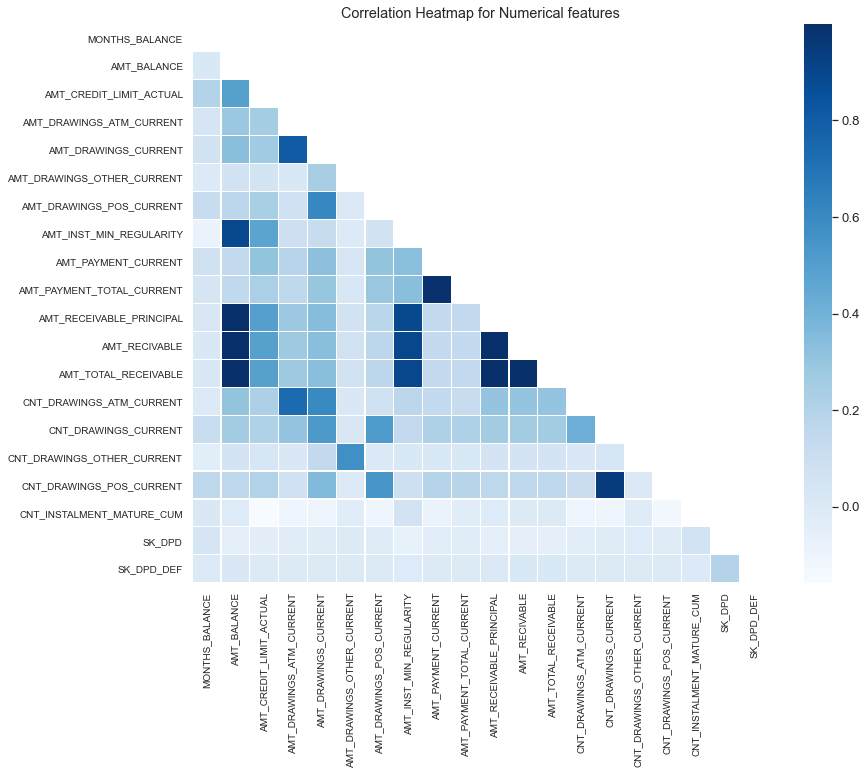

----------------------------------------------------------------------------------------------------


In [90]:
corr_mat = correlation_matrix(credit_card_balance_merged, ['SK_ID_CURR','SK_ID_PREV'], figsize = (13,11))
corr_mat.plot_correlation_matrix()

In [91]:
top_corr_target_df = corr_mat.target_top_corr()
print("-" * 100)
print("Colonnes avec la corrélation avec la target les plus élevées:")
display(top_corr_target_df)
print("-" * 100)

interval columns not set, guessing: ['TARGET', 'MONTHS_BALANCE']
interval columns not set, guessing: ['TARGET', 'AMT_BALANCE']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT_LIMIT_ACTUAL']
interval columns not set, guessing: ['TARGET', 'AMT_DRAWINGS_ATM_CURRENT']
interval columns not set, guessing: ['TARGET', 'AMT_DRAWINGS_CURRENT']
interval columns not set, guessing: ['TARGET', 'AMT_DRAWINGS_OTHER_CURRENT']
interval columns not set, guessing: ['TARGET', 'AMT_DRAWINGS_POS_CURRENT']
interval columns not set, guessing: ['TARGET', 'AMT_INST_MIN_REGULARITY']
interval columns not set, guessing: ['TARGET', 'AMT_PAYMENT_CURRENT']
interval columns not set, guessing: ['TARGET', 'AMT_PAYMENT_TOTAL_CURRENT']
interval columns not set, guessing: ['TARGET', 'AMT_RECEIVABLE_PRINCIPAL']
interval columns not set, guessing: ['TARGET', 'AMT_RECIVABLE']
interval columns not set, guessing: ['TARGET', 'AMT_TOTAL_RECEIVABLE']
interval columns not set, guessing: ['TARGET', 'CNT_DRAWINGS_ATM_CURREN

,Column Name,Phik-Correlation
1,AMT_BALANCE,0.059838
11,AMT_RECIVABLE,0.059311
12,AMT_TOTAL_RECEIVABLE,0.059287
10,AMT_RECEIVABLE_PRINCIPAL,0.058895
0,MONTHS_BALANCE,0.050360
7,AMT_INST_MIN_REGULARITY,0.042174
17,CNT_INSTALMENT_MATURE_CUM,0.038261
13,CNT_DRAWINGS_ATM_CURRENT,0.030052
2,AMT_CREDIT_LIMIT_ACTUAL,0.028752
14,CNT_DRAWINGS_CURRENT,0.027868


----------------------------------------------------------------------------------------------------


Aucune variable corrélé a la target ici non plus, on ne l'utilisera pas

### Récapitulatif 

Nous allons seulement garder les variables les plus corrélées a la target pour la suite de cette analyse,la totalité de ces variables étant dans application_train.  les variblaes des autres dataframes ne sont pas aussi corrélées avec la target.


"EXT_SOURCE_3","EXT_SOURCE_2","EXT_SOURCE_1" => sont des variables crées par la banque basées sur d'autre données du client. elles semblent très pertinantes. 

"REG_CITY_NOT_WORK_CITY" => Si le client habite dans une ville différente que celle de son travail (1 oui 0 non) 

,"YEARS_ID_PUBLISH"=> quand a été changé la carte d'identité du client   

,"DAYS_LAST_PHONE_CHANGE" => Quand le client a changer de telephone   

"YEARS_BIRTH"=> l'age du client en années(nous gardons la variable en année car elle est plus intuitive a utiliser que le nombre de jours)   

"OCCUPATION_TYPE"=> Le type d'occupation qu'a le client (son travail)   

,"ORGANIZATION_TYPE"=> le type d'organisation dans laquelle travail le client    

,"NAME_INCOME_TYPE"=> le type de revenus que le client a (congé maternité, a son propre compte, salarié...)   

"FLAG_EMP_PHONE" => Si le client a fourni un numéro professionel ou pas   

,"REG_CITY_NOT_LIVE_CITY"=> indique si l'adresse du client ne correspond pas a celle fourni par le client au niveau d'une ville (1 oui 0 non),   

"FLAG_DOCUMENT_3"=> Si le client a fourni un certain type de document appellé document 3

"YEARS_EMPLOYED" => Nombre de jours que le client a son travail

In [13]:
application_train = pd.read_csv('application_train.csv')
print('Training data shape: ', application_train.shape)

Training data shape:  (307511, 122)


In [14]:
application_train['AGE_YEARS'] = application_train['DAYS_BIRTH'] * -1 / 365

In [15]:
application_train['YEARS_EMPLOYED'] = application_train.DAYS_EMPLOYED * -1 / 365

In [16]:
application_train["YEARS_LAST_PHONE_CHANGE"]=application_train["DAYS_LAST_PHONE_CHANGE"]*-1/365

In [17]:
application_train["YEARS_ID_PUBLISH"]=application_train["DAYS_ID_PUBLISH"]*-1/365

In [18]:
col_to_keep_app_train = ["EXT_SOURCE_3","EXT_SOURCE_2","EXT_SOURCE_1","REG_CITY_NOT_WORK_CITY","YEARS_ID_PUBLISH","YEARS_LAST_PHONE_CHANGE",
                        "AGE_YEARS","TARGET","OCCUPATION_TYPE","ORGANIZATION_TYPE","NAME_INCOME_TYPE","FLAG_EMP_PHONE","REG_CITY_NOT_LIVE_CITY",
                        "FLAG_DOCUMENT_3","YEARS_EMPLOYED"]

In [19]:
app_train = application_train[col_to_keep_app_train]

Analysons maintenant les variables que nous gardons pour voir si elles sont utilisables dans les modèles

In [20]:
categorical_columns = ["TARGET","OCCUPATION_TYPE","ORGANIZATION_TYPE","NAME_INCOME_TYPE","FLAG_EMP_PHONE","REG_CITY_NOT_LIVE_CITY","FLAG_DOCUMENT_3"]

----------------------------------------------------------------------------------------------------


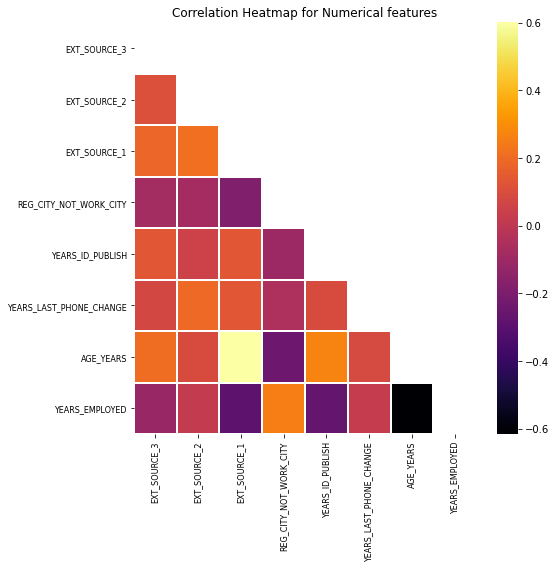

----------------------------------------------------------------------------------------------------


In [21]:
columns_to_drop = list(set(categorical_columns) - set(['TARGET']))
corr_mat = correlation_matrix(app_train, columns_to_drop, figsize = (8,8), fontsize = 8, cmap = 'inferno')
corr_mat.plot_correlation_matrix()

----------------------------------------------------------------------------------------------------


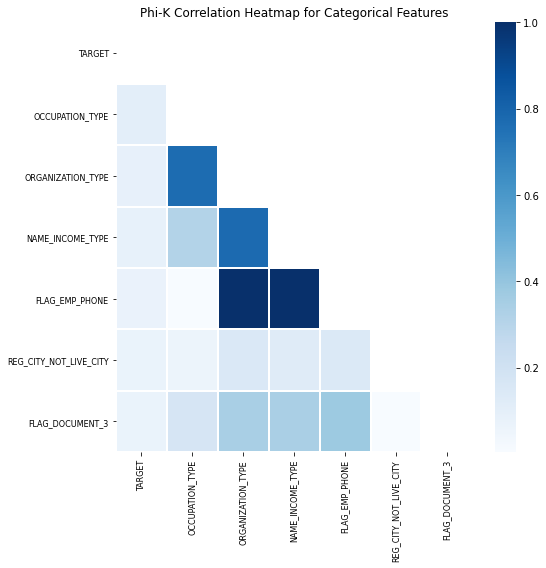

----------------------------------------------------------------------------------------------------
Categories with highest values of Phi-K Correlation value with Target Variable are:


,Column Name,Phik-Correlation
0,OCCUPATION_TYPE,0.102846
1,ORGANIZATION_TYPE,0.089164
2,NAME_INCOME_TYPE,0.084831
3,FLAG_EMP_PHONE,0.072087
4,REG_CITY_NOT_LIVE_CITY,0.069588
5,FLAG_DOCUMENT_3,0.069525


----------------------------------------------------------------------------------------------------


In [22]:
plot_phik_matrix(app_train, categorical_columns, figsize = (8,8), fontsize = 8)

On supprime FLAG EMP PHONE, NAME_INCOME_TYPE et ORGANIZATION_TYPE. Ces variables vont juste rajouter du poids a a certaines variables de notre modéles car elles sont corrélées entre elles

In [23]:
app_train = app_train.drop(["FLAG_EMP_PHONE"],axis=1)

In [24]:
app_train = app_train.drop(["NAME_INCOME_TYPE"],axis=1)

In [25]:
app_train = app_train.drop(["ORGANIZATION_TYPE"],axis=1)

Number of columns having NaN values: 5 columns


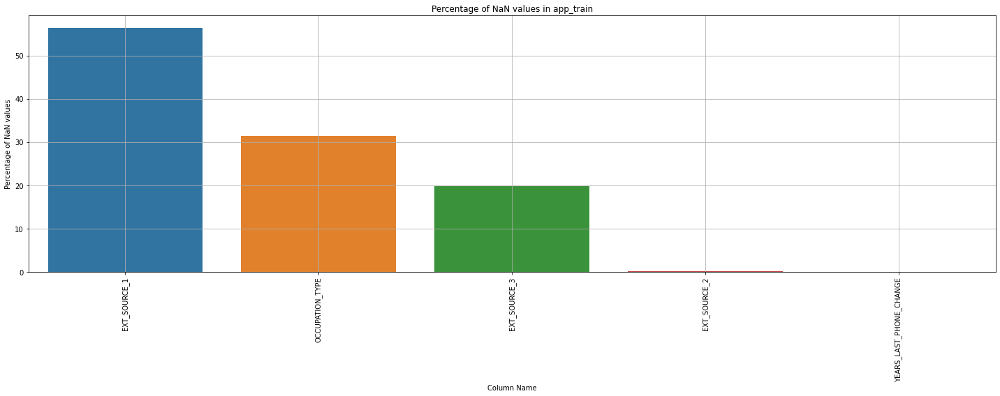

In [26]:
plot_nan_percent(nan_df_create(app_train), 'app_train', grid = True)

In [27]:
app_train_num = app_train.drop(["OCCUPATION_TYPE"],axis=1)

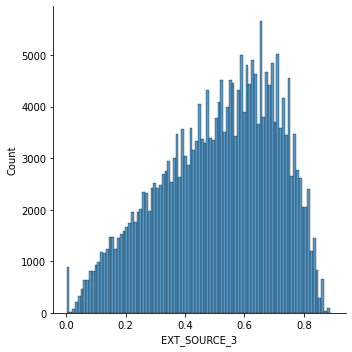

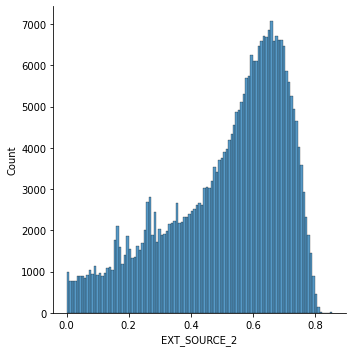

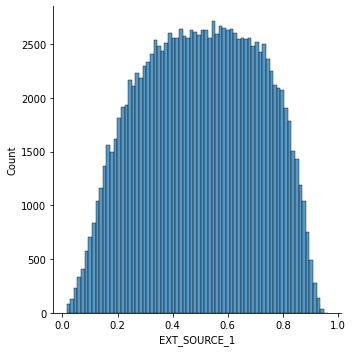

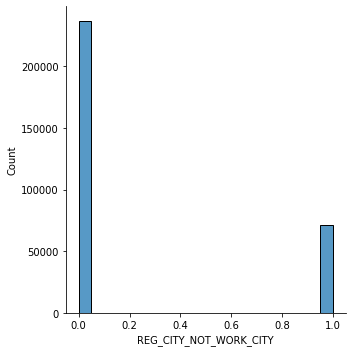

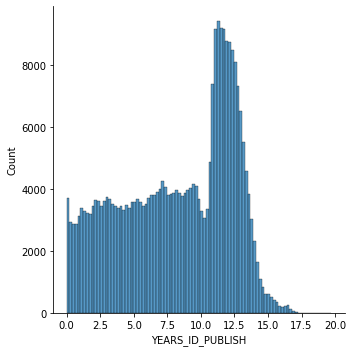

...

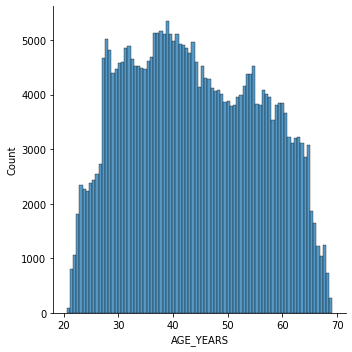

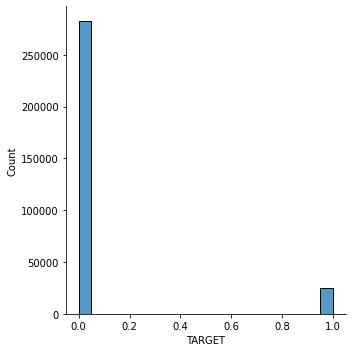

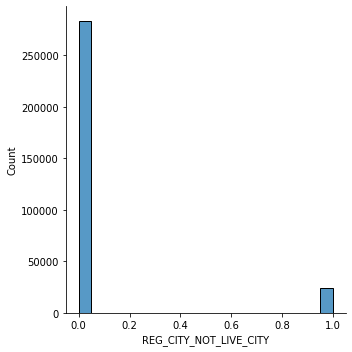

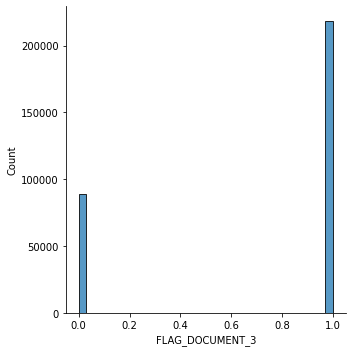

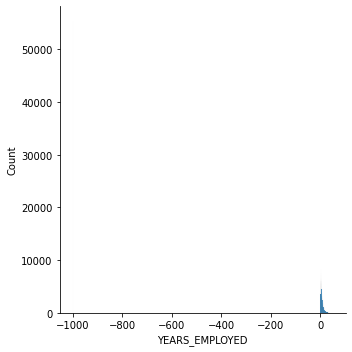

In [28]:
for col in app_train_num:
    sns.displot(data = app_train_num,x=col, kde=False)

In [29]:
(app_train["YEARS_LAST_PHONE_CHANGE"] ==0).value_counts()

False    269839
True      37672
Name: YEARS_LAST_PHONE_CHANGE, dtype: int64

Il y a énormément de valeurs de YEARS_LAST_PHONE_CHANGE sur 0. Cela s'explique surement par le fait que les employés de la banque preferent mettre 0 qu'une valeur en jour. cela peut fausser les modèles

In [30]:
app_train["YEARS_EMPLOYED"].value_counts()

-1000.665753    55374
 0.547945         156
 0.613699         152
 0.630137         151
 0.545205         151
                ...  
 27.465753          1
 38.758904          1
 32.326027          1
 32.400000          1
 30.619178          1
Name: YEARS_EMPLOYED, Length: 12574, dtype: int64

In [31]:
app_train["YEARS_EMPLOYED"] = round(app_train["YEARS_EMPLOYED"], 5)

In [32]:
app_train.drop(app_train.loc[app_train["YEARS_EMPLOYED"]== -1000.66575].index, inplace=True)

In [33]:
app_train["YEARS_EMPLOYED"].value_counts()

0.54795     156
0.61370     152
0.63014     151
0.54521     151
0.58082     150
           ... 
30.81644      1
40.11781      1
37.17534      1
42.65205      1
37.10685      1
Name: YEARS_EMPLOYED, Length: 12573, dtype: int64

In [34]:
app_train.drop(app_train.loc[app_train['YEARS_LAST_PHONE_CHANGE']==0].index, inplace=True)


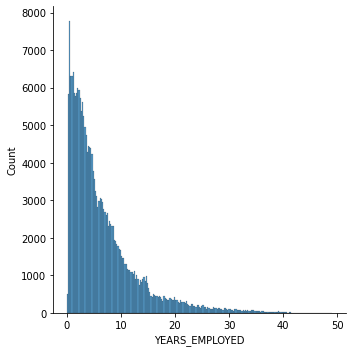

In [35]:
sns.displot(data = app_train["YEARS_EMPLOYED"], kde=False)

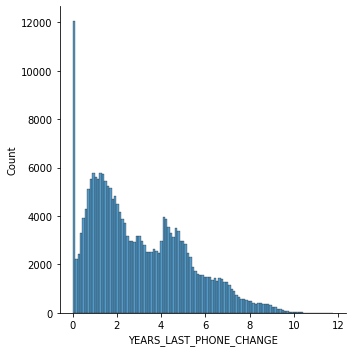

In [36]:
sns.displot(data = app_train["YEARS_LAST_PHONE_CHANGE"], kde=False)

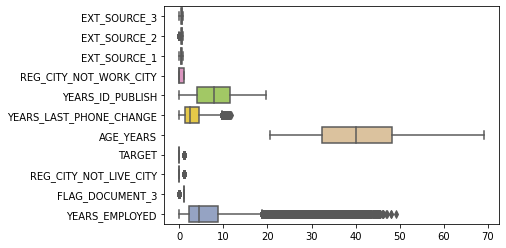

In [37]:
ax = sns.boxplot(data=app_train, orient="h", palette="Set2")

# PREPROCESSING

In [38]:
from sklearn.preprocessing import LabelEncoder
from sklearn import preprocessing
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import f1_score, confusion_matrix,roc_curve,classification_report
from sklearn.model_selection import learning_curve
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import SelectKBest,f_classif
from sklearn.datasets import make_classification


Encodons Occupation type

In [39]:
app_train.dtypes

EXT_SOURCE_3               float64
EXT_SOURCE_2               float64
EXT_SOURCE_1               float64
REG_CITY_NOT_WORK_CITY       int64
YEARS_ID_PUBLISH           float64
YEARS_LAST_PHONE_CHANGE    float64
AGE_YEARS                  float64
TARGET                       int64
OCCUPATION_TYPE             object
REG_CITY_NOT_LIVE_CITY       int64
FLAG_DOCUMENT_3              int64
YEARS_EMPLOYED             float64
dtype: object

In [40]:
app_train['OCCUPATION_TYPE'] = app_train['OCCUPATION_TYPE'].astype('|S80')

In [41]:
label_encoder = LabelEncoder()
 
app_train['OCCUPATION_TYPE']= label_encoder.fit_transform(app_train["OCCUPATION_TYPE"]) 
app_train.head()

,EXT_SOURCE_3,EXT_SOURCE_2,EXT_SOURCE_1,REG_CITY_NOT_WORK_CITY,YEARS_ID_PUBLISH,YEARS_LAST_PHONE_CHANGE,AGE_YEARS,TARGET,OCCUPATION_TYPE,REG_CITY_NOT_LIVE_CITY,FLAG_DOCUMENT_3,YEARS_EMPLOYED
0,0.139376,0.262949,0.083037,0,5.808219,3.106849,25.920548,1,8,0,1,1.74521
1,NaN,0.622246,0.311267,0,0.797260,2.268493,45.931507,0,3,0,1,3.25479
2,0.729567,0.555912,NaN,0,6.934247,2.232877,52.180822,0,8,0,0,0.61644
3,NaN,0.650442,NaN,0,6.676712,1.690411,52.068493,0,8,0,1,8.32603
4,NaN,0.322738,NaN,1,9.473973,3.030137,54.608219,0,3,0,0,8.32329


Nous obtenons le résultat suivant : 

In [42]:
app_train['OCCUPATION_TYPE'].value_counts()

8     48071
18    36376
14    28526
3     24732
10    19412
4     16252
6     10205
0      8940
11     7527
16     5809
2      5131
1      4090
12     2387
9      1739
15     1187
17     1182
13      689
5       514
7       479
Name: OCCUPATION_TYPE, dtype: int64

In [43]:
num_0 = len(app_train[app_train['TARGET']==0])
num_1 = len(app_train[app_train['TARGET']==1])
print(num_0,num_1)

# random undersample
undersampled_data = pd.concat([ app_train[app_train['TARGET']==0].sample(num_1) , app_train[app_train['TARGET']==1] ])
print(len(undersampled_data))


204497 18751
37502


In [44]:
app_train["TARGET"].value_counts()

0    204497
1     18751
Name: TARGET, dtype: int64

In [45]:
undersampled_data["TARGET"].value_counts()

1    18751
0    18751
Name: TARGET, dtype: int64

In [46]:
y_train = app_train["TARGET"]
X_train = app_train.drop("TARGET", axis=1)

In [47]:
y_under = undersampled_data["TARGET"]
X_under = undersampled_data.drop("TARGET", axis=1)

In [48]:
X_train_under, X_test_under, y_train_under, y_test_under = train_test_split(X_under, y_under,
                                                                                test_size=0.25, random_state=42)

print('Train set:', X_train_under.shape)
print('Test set:', X_test_under.shape)

Train set: (28126, 11)
Test set: (9376, 11)


In [49]:
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.25, random_state=42)

print('Train set:', X_train.shape)
print('Test set:', X_test.shape)

Train set: (167436, 11)
Test set: (55812, 11)


In [50]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler

In [51]:
Simpleimputer = SimpleImputer(strategy = 'median')

scaler = MinMaxScaler(feature_range = (0, 1))

Simpleimputer.fit(X_train)

# Transform both training and testing data
X_train = Simpleimputer.transform(X_train)
X_test = Simpleimputer.transform(X_test)

# Repeat with the scaler
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

print('Training data shape: ', X_train.shape)
print('Testing data shape: ', X_test.shape)

Training data shape:  (167436, 11)
Testing data shape:  (55812, 11)


In [52]:
SimpleImputer_under = SimpleImputer(strategy = 'median')

scaler_under = MinMaxScaler(feature_range = (0, 1))

SimpleImputer_under.fit(X_train_under)

# Transform both training and testing data
X_train_under = SimpleImputer_under.transform(X_train_under)
X_test_under = SimpleImputer_under.transform(X_test_under)

# Repeat with the scaler
scaler_under.fit(X_train_under)
X_train_under = scaler_under.transform(X_train_under)
X_test_under = scaler_under.transform(X_test_under)

print('Training data shape: ', X_train_under.shape)
print('Testing data shape: ', X_test_under.shape)

Training data shape:  (28126, 11)
Testing data shape:  (9376, 11)


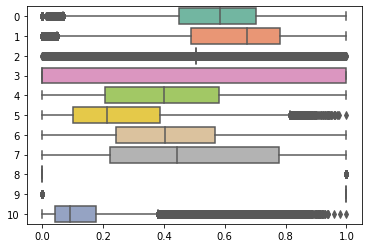

In [53]:
ax = sns.boxplot(data=X_train, orient="h", palette="Set2")

In [54]:
app_train.columns

Index(['EXT_SOURCE_3', 'EXT_SOURCE_2', 'EXT_SOURCE_1',
       'REG_CITY_NOT_WORK_CITY', 'YEARS_ID_PUBLISH', 'YEARS_LAST_PHONE_CHANGE',
       'AGE_YEARS', 'TARGET', 'OCCUPATION_TYPE', 'REG_CITY_NOT_LIVE_CITY',
       'FLAG_DOCUMENT_3', 'YEARS_EMPLOYED'],
      dtype='object')

# MACHINE LEARNING 

In [55]:
liste_Fbeta = []

In [56]:
liste_recall = []

In [57]:
liste_precision = []

In [58]:
liste_Fbeta_under = []

In [59]:
liste_recall_under = []

In [60]:
liste_precision_under = []

In [61]:
from sklearn.metrics import recall_score
from sklearn.dummy import DummyClassifier
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_score
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
import sklearn.metrics as metrics
from sklearn.tree import DecisionTreeClassifier
from numpy import sqrt
from numpy import argmax
from sklearn.datasets import make_classification
from sklearn.metrics import fbeta_score
from sklearn.metrics import make_scorer

In [62]:
def myevaluationunder(model):
  model.fit(X_train_under, y_train_under)
  ypred = model.predict(X_test_under)
  print(confusion_matrix(y_test_under,ypred))
  print(classification_report(y_test_under,ypred))
  print("Score de précision du modèle :")
  print(precision_score(y_test_under, ypred))
  print("Score de recall du modèle :")
  print(recall_score(y_test_under,ypred))
  print("Score F1 du modèle :")
  print(f1_score(y_test_under, ypred))
  print("Score F2 du modèle :")
  print(fbeta_score(y_test_under, ypred,beta=2))
  liste_Fbeta_under.append(fbeta_score(y_test_under, model.predict(X_test_under),beta=2))
  liste_recall_under.append(recall_score(y_test_under,model.predict(X_test_under)))
  liste_precision_under.append(precision_score(y_test_under,model.predict(X_test_under)))


    

In [63]:
def myevaluationsimple(model):
    model.fit(X_train, y_train)
    ypred = model.predict(X_test)
    print(confusion_matrix(y_test,ypred))
    print(classification_report(y_test,ypred))
    print("Score de précision du modèle :")
    print(precision_score(y_test, ypred))
    print("Score de recall du modèle :")
    print(recall_score(y_test,ypred))
    print("Score F1 du modèle :")
    print(f1_score(y_test, ypred))
    print("Score F2 du modèle :")
    print(fbeta_score(y_test, ypred,beta=2))
    
    liste_Fbeta.append(fbeta_score(y_test, model.predict(X_test),beta=2))
    liste_recall.append(recall_score(y_test,model.predict(X_test)))
    liste_precision.append(precision_score(y_test,model.predict(X_test)))


# Baseline

21184/248655 = 0.09. Nous allons donc ajouter un poids de 0.09 pour 0 et 0.91 pour 1 afin que les deux Targets soient équilibrées

In [64]:
dummy = DummyClassifier()

In [65]:
myevaluationsimple(dummy)

[[46804  4382]
 [ 4219   407]]
              precision    recall  f1-score   support

           0       0.92      0.91      0.92     51186
           1       0.08      0.09      0.09      4626

    accuracy                           0.85     55812
   macro avg       0.50      0.50      0.50     55812
weighted avg       0.85      0.85      0.85     55812

Score de précision du modèle :
0.08498642722906662
Score de recall du modèle :
0.08798097708603546
Score F1 du modèle :
0.08645778013807755
Score F2 du modèle :
0.08736530288069379


In [66]:
myevaluationunder(dummy)

[[2328 2351]
 [2305 2392]]
              precision    recall  f1-score   support

           0       0.50      0.50      0.50      4679
           1       0.50      0.51      0.51      4697

    accuracy                           0.50      9376
   macro avg       0.50      0.50      0.50      9376
weighted avg       0.50      0.50      0.50      9376

Score de précision du modèle :
0.5043221589711153
Score de recall du modèle :
0.509261230572706
Score F1 du modèle :
0.5067796610169492
Score F2 du modèle :
0.5082656920657855


## GridSearchCV

Nous allons utiliser gridsearchCV pour voir quels modèles sont les plus performants parmis ceux que nous avons choisi, et nous allons essayer d'optimiser certains hyperparamètres. La problématique méier impliquant qu'il faut le plus petit nombre de faux positifs possible. on va baser notre notation sur la précision

In [74]:
seed=1

models = [
            'DTree',
            'Logreg',
            'RFC',
            
         ]

clfs = [
        DecisionTreeClassifier(random_state=seed,class_weight='balanced'),
        LogisticRegression(solver='newton-cg', multi_class='multinomial',class_weight='balanced'),
        RandomForestClassifier(random_state=seed,n_jobs=-1,class_weight='balanced'),
        ]

params = {
            models[0]:{'min_samples_leaf':[1,2,3,4],
                       'min_samples_split':[4, 6]},
             
    
            models[1]:{ 'C' : np.logspace(-4, 4, 50),
                        'penalty' : ['l1', 'l2']},
    
            models[2]:{'n_estimators': [50, 250],
                        'min_samples_split': [4, 6]},
    

                    
         }


In [ ]:
ftwo_scorer = make_scorer(fbeta_score, beta=2)
for name, estimator in zip(models,clfs):
    print(name)
    clf = GridSearchCV(estimator, params[name], scoring=ftwo_scorer, n_jobs=-1, cv=5)
    clf.fit(X_train_under, y_train_under)

    print("best params: " + str(clf.best_params_))

Nous obtenons: 

Logreg

best params: {'C': 0.004291934260128779, 'penalty': 'l2'}


Dtree

best params: {'min_samples_leaf': 2, 'min_samples_split': 4}



RFC

best params: {'min_samples_split': 6, 'n_estimators': 250}


Nous nous retrouvons donc avec ces paramètres optimaux : 

In [67]:
Logreg_opti = LogisticRegression(C = 0.004291934260128779 , penalty = 'l2',solver='newton-cg',class_weight='balanced'

In [68]:
Dtree_opti = DecisionTreeClassifier(min_samples_leaf = 2,min_samples_split =4, class_weight='balanced'

In [69]:
RFC_opti = RandomForestClassifier(random_state=1,n_jobs=-1,min_samples_split = 6, n_estimators= 250, class_weight='balanced'

# Regression logistique

Essayons d'abord de confirmer le seuil optimal que nous avons calculer en faisant un gridsearch

Fitting 5 folds for each of 200 candidates, totalling 1000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   13.4s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 640 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed:  7.3min finished


Text(0.5, 1.0, 'Scoring for different class weights')

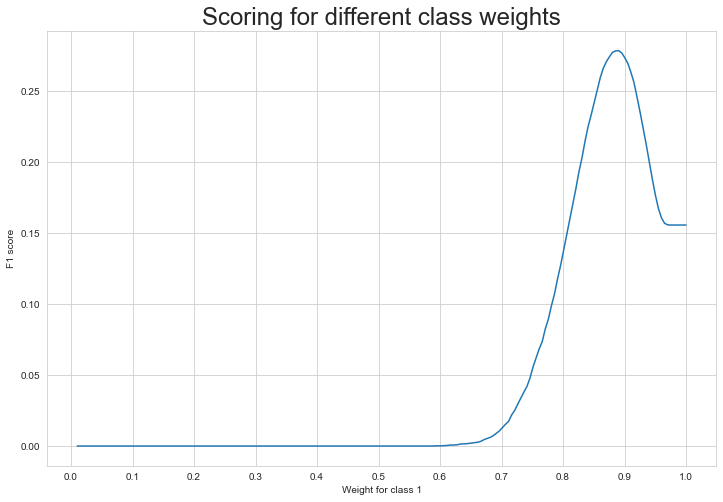

In [187]:
from sklearn.model_selection import StratifiedKFold
lr = LogisticRegression(C = 0.004291934260128779 , penalty = 'l2',solver='newton-cg')

weights = np.linspace(0.0,0.99,200)

param_grid = {'class_weight': [{0:x, 1:1.0-x} for x in weights]}

gridsearch = GridSearchCV(estimator= lr, 
                          param_grid= param_grid,
                          cv=StratifiedKFold(), 
                          n_jobs=-1, 
                          scoring='f1', 
                          verbose=2).fit(X_train, y_train)

#Ploting the score for different values of weight
sns.set_style('whitegrid')
plt.figure(figsize=(12,8))
weigh_data = pd.DataFrame({ 'score': gridsearch.cv_results_['mean_test_score'], 'weight': (1- weights)})
sns.lineplot(weigh_data['weight'], weigh_data['score'])
plt.xlabel('Weight for class 1')
plt.ylabel('F1 score')
plt.xticks([round(i/10,1) for i in range(0,11,1)])
plt.title('Scoring for different class weights', fontsize=24)

Le seuil optimal est de 0.11 pour la classe 0 et 0.89 pour la classe 1, c'est bien ce qu'on avait calculer

In [98]:
myevaluationsimple(Logreg_opti)


[[37182 14004]
 [ 1877  2749]]
              precision    recall  f1-score   support

           0       0.95      0.73      0.82     51186
           1       0.16      0.59      0.26      4626

    accuracy                           0.72     55812
   macro avg       0.56      0.66      0.54     55812
weighted avg       0.89      0.72      0.78     55812

Score de précision du modèle :
0.16409001372888438
Score de recall du modèle :
0.5942498919152616
Score F1 du modèle :
0.25716824921652087
Score F2 du modèle :
0.38985166066313076


In [81]:
myevaluationunder(Logreg_opti)

[[   0 4679]
 [   0 4697]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      4679
           1       0.50      1.00      0.67      4697

    accuracy                           0.50      9376
   macro avg       0.25      0.50      0.33      9376
weighted avg       0.25      0.50      0.33      9376

Score de précision du modèle :
0.5009598976109215
Score de recall du modèle :
1.0
Score F1 du modèle :
0.6675193633198323
Score F2 du modèle :
0.8338659281352081


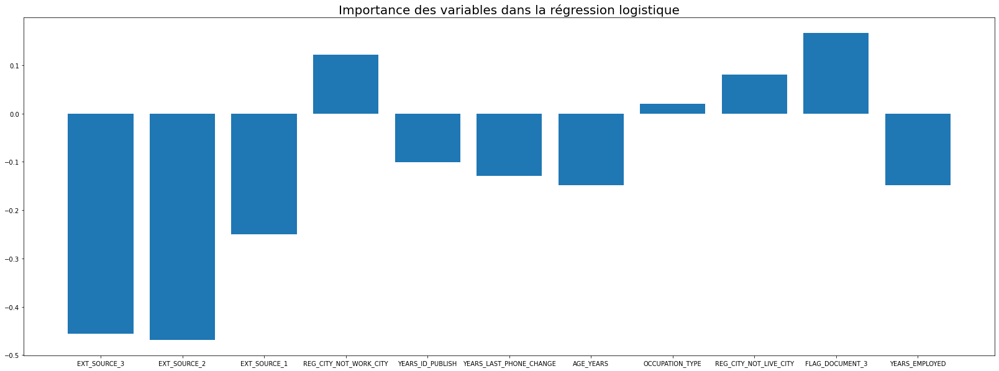

In [82]:
from sklearn.datasets import make_classification
importance = Logreg_opti.coef_[0]

fig, ax = plt.subplots(figsize=(28, 10))

plt.title('Importance des variables dans la régression logistique',fontsize = 20)
plt.bar((app_train.drop("TARGET", axis=1)).columns, importance)
plt.show()

## Decision Tree

In [83]:
myevaluationsimple(Dtree_opti)

[[45965  5221]
 [ 3745   881]]
              precision    recall  f1-score   support

           0       0.92      0.90      0.91     51186
           1       0.14      0.19      0.16      4626

    accuracy                           0.84     55812
   macro avg       0.53      0.54      0.54     55812
weighted avg       0.86      0.84      0.85     55812

Score de précision du modèle :
0.1443788921665028
Score de recall du modèle :
0.1904453091223519
Score F1 du modèle :
0.16424310216256524
Score F2 du modèle :
0.1790213768999431


In [84]:
myevaluationunder(Dtree_opti)

[[2513 2166]
 [1724 2973]]
              precision    recall  f1-score   support

           0       0.59      0.54      0.56      4679
           1       0.58      0.63      0.60      4697

    accuracy                           0.59      9376
   macro avg       0.59      0.59      0.58      9376
weighted avg       0.59      0.59      0.58      9376

Score de précision du modèle :
0.5785172212492703
Score de recall du modèle :
0.6329572067276985
Score F1 du modèle :
0.6045140300935339
Score F2 du modèle :
0.6212646800685417


<AxesSubplot:>

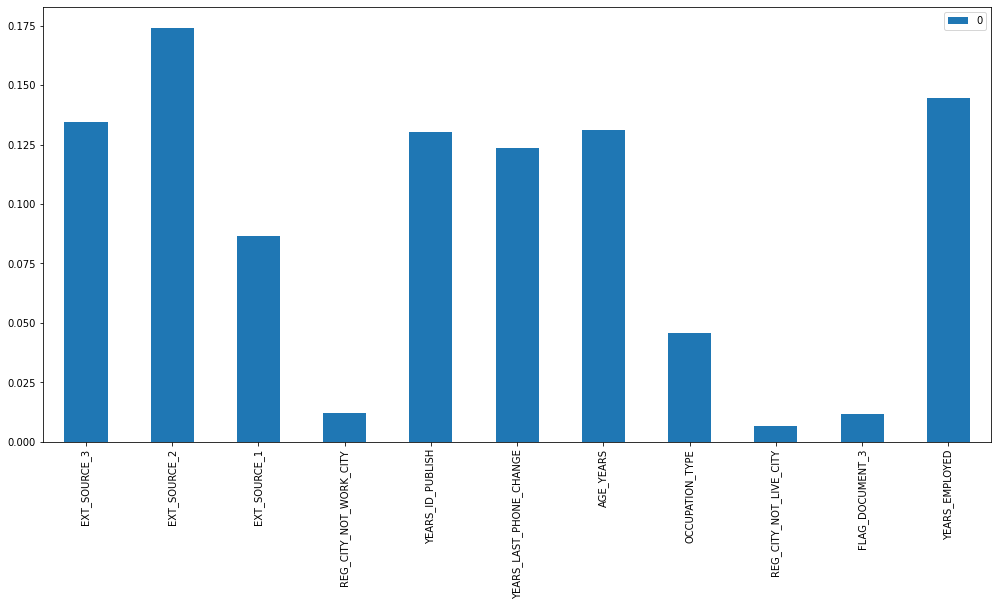

In [85]:
pd.DataFrame(Dtree_opti.feature_importances_,index=(app_train.drop("TARGET", axis=1)).columns).plot.bar(figsize=(17,8))

## Random Forest Classifier

In [86]:
myevaluationsimple(RFC_opti)

[[51025   161]
 [ 4516   110]]
              precision    recall  f1-score   support

           0       0.92      1.00      0.96     51186
           1       0.41      0.02      0.04      4626

    accuracy                           0.92     55812
   macro avg       0.66      0.51      0.50     55812
weighted avg       0.88      0.92      0.88     55812

Score de précision du modèle :
0.4059040590405904
Score de recall du modèle :
0.023778642455685256
Score F1 du modèle :
0.044925464570144985
Score F2 du modèle :
0.029294274300932094


In [87]:
myevaluationunder(RFC_opti)

[[2721 1958]
 [1184 3513]]
              precision    recall  f1-score   support

           0       0.70      0.58      0.63      4679
           1       0.64      0.75      0.69      4697

    accuracy                           0.66      9376
   macro avg       0.67      0.66      0.66      9376
weighted avg       0.67      0.66      0.66      9376

Score de précision du modèle :
0.6421129592396271
Score de recall du modèle :
0.7479242069406004
Score F1 du modèle :
0.690991345397325
Score F2 du modèle :
0.7240611731728431


<AxesSubplot:>

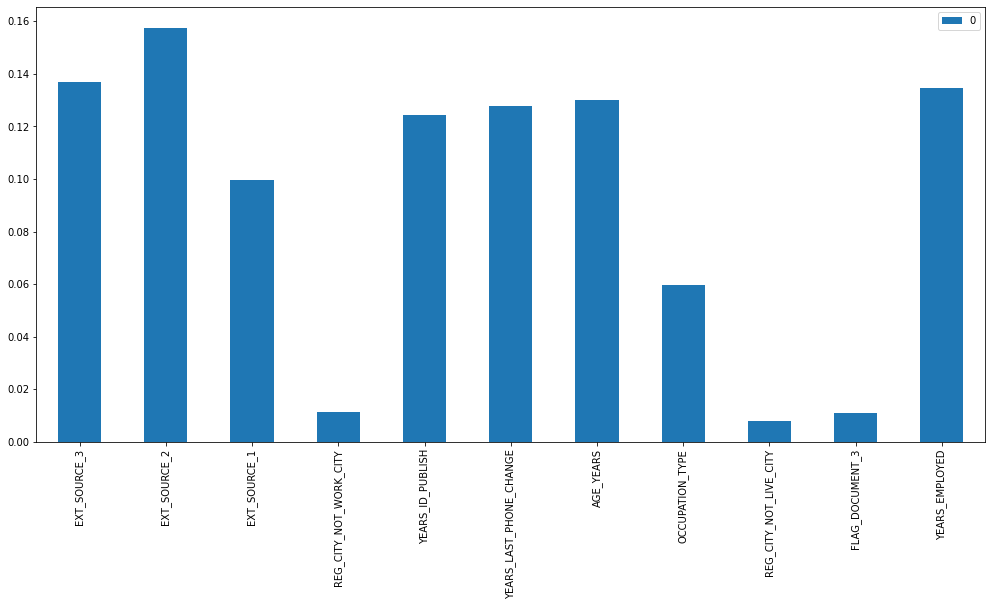

In [88]:
pd.DataFrame(RFC_opti.feature_importances_,index=(app_train.drop("TARGET", axis=1)).columns).plot.bar(figsize=(17,8))

## Courbes ROC 

Nous allons maintenant nous intéresser aux courbes ROC afin de calculer l'aire sous la courbe, qui est un bon indicateur de la performance des modèles

In [153]:
liste_AUC = []

In [154]:
liste_AUC_under= []

In [155]:
def auroc(model):

    probs = model.predict_proba(X_test)
    preds = probs[:,1]
    fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
    roc_auc = metrics.auc(fpr, tpr)

    plt.title('{} ROC avec données sans manipulation'.format(model))
    plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
    
    liste_AUC.append(roc_auc)
    
    probs = model.predict_proba(X_test_under)
    preds = probs[:,1]
    fpr, tpr, threshold = metrics.roc_curve(y_test_under, preds)
    roc_auc = metrics.auc(fpr, tpr)

    plt.title('{} ROC avec données underfittées'.format(model))
    plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
    
    liste_AUC_under.append(roc_auc)


### Auroc Dummy

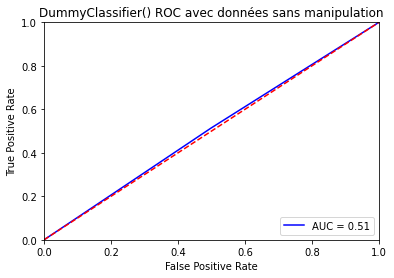

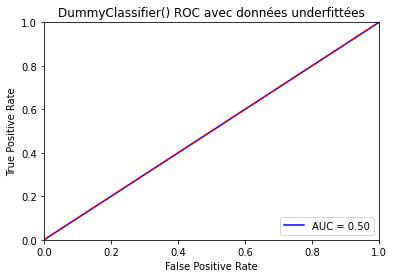

In [156]:
auroc(dummy)

### Auroc Regression logistique

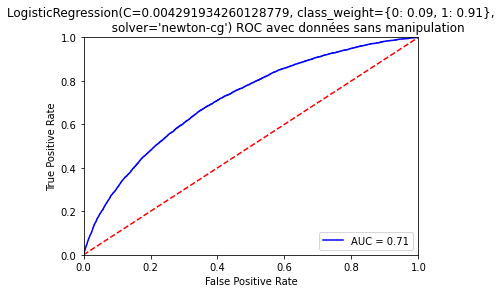

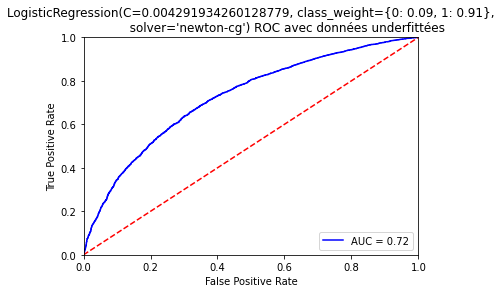

In [157]:
auroc(Logreg_opti)

### Auroc DecisionTreeClassifier

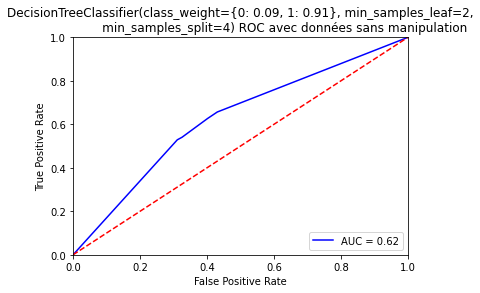

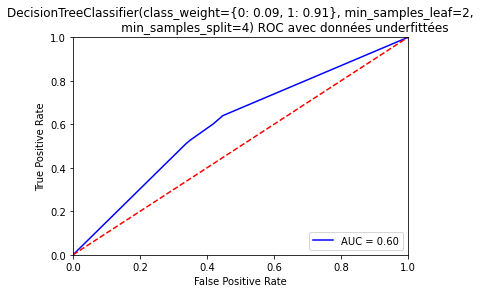

In [158]:
auroc(Dtree_opti)

### Auroc Random forest 

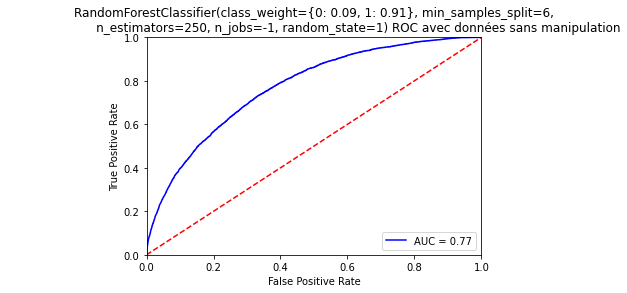

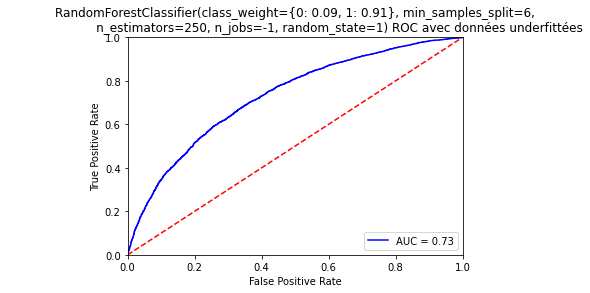

In [159]:
auroc(RFC_opti)

# Récapitulatif

### Score F2 des différents classifieurs

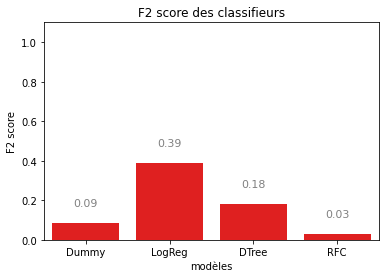

In [181]:
x_axis = ['Dummy', 'LogReg', 'DTree', 'RFC']
y_axis = liste_Fbeta

plt.xlabel('modèles')
plt.ylabel('F2 score')
plt.title('F2 score des classifieurs')

g=sns.barplot(x_axis, y_axis, color="red")
ax=g
#annotate axis = seaborn axis
for p in ax.patches:
             ax.annotate("%.2f" % p.get_height(), (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha='center', va='center', fontsize=11, color='gray', xytext=(0, 20),
                 textcoords='offset points')
_ = g.set_ylim(0,1.1)


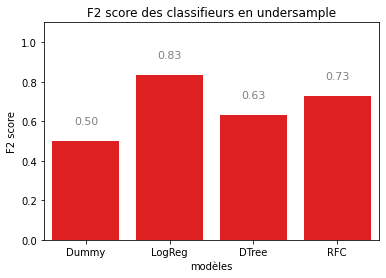

In [180]:
x_axis = ['Dummy', 'LogReg', 'DTree', 'RFC']
y_axis = liste_Fbeta_under

plt.xlabel('modèles')
plt.ylabel('F2 score')
plt.title('F2 score des classifieurs en undersample')

g=sns.barplot(x_axis, y_axis, color="red")
ax=g
#annotate axis = seaborn axis
for p in ax.patches:
             ax.annotate("%.2f" % p.get_height(), (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha='center', va='center', fontsize=11, color='gray', xytext=(0, 20),
                 textcoords='offset points')
_ = g.set_ylim(0,1.1)


### Recall des différents classifieurs

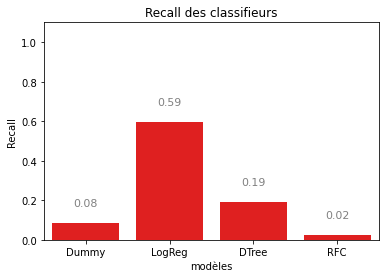

In [179]:
x_axis = ['Dummy', 'LogReg', 'DTree', 'RFC']
y_axis = liste_recall

plt.xlabel('modèles')
plt.ylabel('Recall')
plt.title('Recall des classifieurs')

g=sns.barplot(x_axis, y_axis, color="red")
ax=g
#annotate axis = seaborn axis
for p in ax.patches:
             ax.annotate("%.2f" % p.get_height(), (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha='center', va='center', fontsize=11, color='gray', xytext=(0, 20),
                 textcoords='offset points')
_ = g.set_ylim(0,1.1)


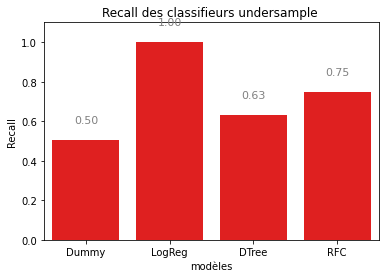

In [105]:
x_axis = ['Dummy', 'LogReg', 'DTree', 'RFC']
y_axis = liste_recall_under

plt.xlabel('modèles')
plt.ylabel('Recall')
plt.title('Recall des classifieurs undersample ')

g=sns.barplot(x_axis, y_axis, color="red")
ax=g
#annotate axis = seaborn axis
for p in ax.patches:
             ax.annotate("%.2f" % p.get_height(), (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha='center', va='center', fontsize=11, color='gray', xytext=(0, 20),
                 textcoords='offset points')
_ = g.set_ylim(0,1.1)

### Précision des différents classifieurs

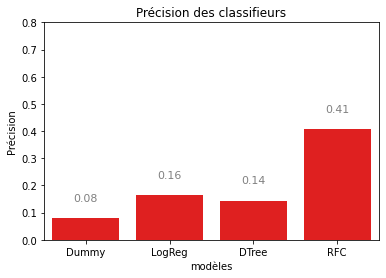

In [183]:
x_axis = ['Dummy', 'LogReg', 'DTree', 'RFC']
y_axis = liste_precision

plt.xlabel('modèles')
plt.ylabel('Précision')
plt.title('Précision des classifieurs')

g=sns.barplot(x_axis, y_axis, color="red")
ax=g
#annotate axis = seaborn axis
for p in ax.patches:
             ax.annotate("%.2f" % p.get_height(), (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha='center', va='center', fontsize=11, color='gray', xytext=(0, 20),
                 textcoords='offset points')
_ = g.set_ylim(0,0.8)


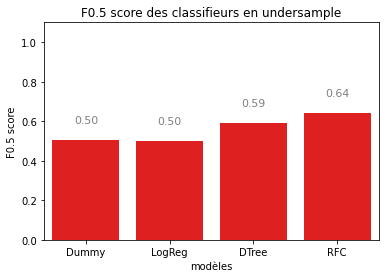

In [184]:
x_axis = ['Dummy', 'LogReg', 'DTree', 'RFC']
y_axis = liste_precision_under

plt.xlabel('modèles')
plt.ylabel('F0.5 score')
plt.title('F0.5 score des classifieurs en undersample')

g=sns.barplot(x_axis, y_axis, color="red")
ax=g
#annotate axis = seaborn axis
for p in ax.patches:
             ax.annotate("%.2f" % p.get_height(), (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha='center', va='center', fontsize=11, color='gray', xytext=(0, 20),
                 textcoords='offset points')
_ = g.set_ylim(0,1.1)

Nous allons garder le modèle regression logistique pour les données pondérées et le random forest pour les données undersamplées . 

# Rajout d'un seuil pour correspondre a la problématique métier

Nous ajoutons un seuil de detection. un modele probabiliste donnant une valeur de 0 si la probabilité est supérieure a 0.5, cela est insuffisant pour la problématique métier

Ici, il faut une probabilité d'avoir un 0 supérieure a 0.7 pour avoir une valeur détéctée par le modèle de 0

## Cas des données pondérées (regression logistique)

In [103]:
ypred = (Logreg_opti.predict_proba(X_test)[:,1] >= 0.3).astype(bool)  

print(confusion_matrix(y_test,ypred))
print(classification_report(y_test,ypred))
print("Score de précision du modèle :")
print(precision_score(y_test, ypred))
print("Score de recall du modèle :")
print(recall_score(y_test,ypred))
print("Score F1 du modèle :")
print(f1_score(y_test, ypred))
print("Score F2 du modèle :")
print(fbeta_score(y_test, ypred,beta=2))

[[ 6119 45067]
 [  100  4526]]
              precision    recall  f1-score   support

           0       0.98      0.12      0.21     51186
           1       0.09      0.98      0.17      4626

    accuracy                           0.19     55812
   macro avg       0.54      0.55      0.19     55812
weighted avg       0.91      0.19      0.21     55812

Score de précision du modèle :
0.09126287984191317
Score de recall du modèle :
0.9783830523130134
Score F1 du modèle :
0.16695254431103487
Score F2 du modèle :
0.3323200728372762


## Random forest (données undersamplées)

In [106]:
ypred = (RFC_opti.predict_proba(X_test_under)[:,1] >= 0.3).astype(bool)  

print(confusion_matrix(y_test_under,ypred))
print(classification_report(y_test_under,ypred))
print("Score de précision du modèle :")
print(precision_score(y_test_under, ypred))
print("Score de recall du modèle :")
print(recall_score(y_test_under,ypred))
print("Score F1 du modèle :")
print(f1_score(y_test_under, ypred))
print("Score F2 du modèle :")
print(fbeta_score(y_test_under, ypred,beta=2))

[[1135 3544]
 [ 299 4398]]
              precision    recall  f1-score   support

           0       0.79      0.24      0.37      4679
           1       0.55      0.94      0.70      4697

    accuracy                           0.59      9376
   macro avg       0.67      0.59      0.53      9376
weighted avg       0.67      0.59      0.53      9376

Score de précision du modèle :
0.5537647947620247
Score de recall du modèle :
0.9363423461784117
Score F1 du modèle :
0.6959411345834322
Score F2 du modèle :
0.8226711560044895


Pour être le plus efficace possible, il faudrait voir avec l'entreprise le seuil qui serait optimal pour eux afin de maximiser le coût gain/risque

# Simulation d'un client

In [75]:
df = app_train.drop("TARGET", axis=1)

In [76]:
for col in df.select_dtypes(include=np.number):
    df[col] = df[col].fillna(df[col].median())


In [77]:
x = df.values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
df = pd.DataFrame(x_scaled)

In [78]:
import lime
import lime.lime_tabular
 
# Creating the Lime Explainer

lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train,
    training_labels=y_train,
    feature_names=app_train.drop("TARGET", axis=1).columns.tolist(),
    feature_selection="lasso_path",
    class_names=["0", "1"],
    discretize_continuous=True,
    discretizer="entropy",
)

## Cas avec la régression logistique (données pondérées)

### Cas d'une personne a qui on acceptera le prêt 

In [112]:
exp = lime_explainer.explain_instance(df.loc[2], Logreg_opti.predict_proba, num_features=11)
 
exp.show_in_notebook(show_table=True)


### Cas d'une personne a qui on refusera le prêt 

In [90]:
exp = lime_explainer.explain_instance(df.iloc[14], Logreg_opti.predict_proba, num_features=11)
 
exp.show_in_notebook(show_table=True)


### Cas d'une personne n'étant pas considéré comme solvable par le seuil défini (qui peut améliorer son dossier)

In [111]:
exp = lime_explainer.explain_instance(df.iloc[10], Logreg_opti.predict_proba, num_features=11)
 
exp.show_in_notebook(show_table=True)


## Cas avec le Random Forest (données underfittées)

In [107]:
lime_explainer_under = lime.lime_tabular.LimeTabularExplainer(
    X_train_under,
    training_labels=y_train_under,
    feature_names=app_train.drop("TARGET", axis=1).columns.tolist(),
    feature_selection="lasso_path",
    class_names=["0", "1"],
    discretize_continuous=True,
    discretizer="entropy",
)

### Cas d'une personne a qui on acceptera le prêt 

In [122]:
exp = lime_explainer_under.explain_instance(df.iloc[6], RFC_opti.predict_proba, num_features=11)
 
exp.show_in_notebook(show_table=True)


### Cas d'une personne a qui on refusera le prêt 

In [108]:
exp = lime_explainer_under.explain_instance(df.iloc[14], RFC_opti.predict_proba, num_features=11)
 
exp.show_in_notebook(show_table=True)


### Cas d'une personne pouvant améliorer son dossier (non détécté par le seuil)

In [113]:
exp = lime_explainer_under.explain_instance(df.iloc[2], RFC_opti.predict_proba, num_features=11)
 
exp.show_in_notebook(show_table=True)